## Dataset
You can find the dataset in the data folder of the repository. The folder contains two files:
* dow_jones_index.data - dataset data
* dow_jones_index.names - dataset information and details

## Business Analysis
Here you should conduct a brief analysis of what is Dow Jones Index. You can enumerate the main topics to take into account based on the dataset provided as well as your understandings of the variables.


-----
*Add here your business analysis conclusions (max. 200 words)*
-----

The Dow Jones Index also known as Dow Jones Industrial Average tracks 30 large companies registered on stock exchanges in the United States of America. This index includes companies such as IBM, Intel, Microsoft, etc. To see all the companies see: https://www.cnbc.com/dow-30/. 

This index was created to assess the health of the economy in the U.S. It is calculated as the sum of the stock prices of the 30 companies divided by the Dow divisor. This Dow divisor is constantly updated when a company goes through a stock split. 

The provided dataset contains stock data for the 1st and 2nd quarters from 2011 (1/7/2011 - 6/24/2011). The data is stored on a weekly basis.

After analyzing the two dataset files, the following variables are the most relevant for our task:
- **quarter**: to localize the activity period
- **stock**: to identify the company
- **date**: to identify the week
- **open**: stock value at the beginning of the week
- **close**: stock value at the end of the week
- **percent_change_price**: stock movement during the week
- **volume**: number of stocks sold during the week
    
Sources: https://en.wikipedia.org/wiki/Dow_Jones_Industrial_Average <br />
https://www.investopedia.com/terms/d/djia.asp <br />
https://www.youtube.com/watch?v=y-RGEos-lus <br />
https://www.cnbc.com/dow-30/


## Data Understanding
During the data understanding phase, you should focus on understanding what each variable represents, compute statistics and visualizations. Some questions that may guide your work follow:
* Feature engineering: should new features be created from the existing ones?
* What will be your features and your label?
* Is the dataset ready for the prediction task? (ex: missing values)
* How will the data be split into train and test sets?

-----

In [1]:
#add here your imports
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import subplots, show
from seaborn import heatmap

# converter to remove the dollar sign from the collumns with money values
money_converter={'open': lambda s: float(s.replace('$', '')),
                'high': lambda s: float(s.replace('$', '')),
                'low': lambda s: float(s.replace('$', '')),
                'close': lambda s: float(s.replace('$', '')),
                'next_weeks_open': lambda s: float(s.replace('$', '')),
                'next_weeks_close': lambda s: float(s.replace('$', ''))
                }

# loading of the data 
data = pd.read_csv('data/dow_jones_index.data', index_col=[0,1,2], sep=',', decimal='.', parse_dates=True, converters=money_converter)

# calculate the accumulated close value of each day for the 30 companies
aux = pd.read_csv('data/dow_jones_index.data', index_col=[0], sep=',', decimal='.', parse_dates=True, converters=money_converter)

ac = {}
for index, row in data.iterrows():
    if index[2] not in ac:
        ac[index[2]] = row["close"]
    else:
        ac[index[2]] += row["close"]

ac = list(ac.values())

# since there wasn't a variable for the previous week close value, 
# the market is asssumed to be stable on the 1st week of the dataset, i.e., market_movement=0
market_movement = [0]

for i in range(1, len(ac)):
    market_movement.append(((ac[i] - ac[i-1]) / ac[i]) * 100)
    
market_movement_q1 = market_movement[0:12]
market_movement_q2 = market_movement[12:]

previous_week_market_movement = []

for i in range(360):
    previous_week_market_movement.append(market_movement_q1[i%12])

for i in range(390):
    previous_week_market_movement.append(market_movement_q2[i%13])

# add the new column that gives infomation about the previous week market movement
data["previous_week_market_movement"] = previous_week_market_movement

# creation of a target (next_week_profitable) feature if the solution is performed through classification
data["next_week_profitable"] = (data["next_weeks_close"] > data["next_weeks_open"]).replace({True:1, False:0})

data

open   high    low  close     volume  \
quarter stock date                                                
1       AA    2011-01-07  15.82  16.72  15.78  16.42  239655616   
              2011-01-14  16.71  16.71  15.64  15.97  242963398   
              2011-01-21  16.19  16.38  15.60  15.79  138428495   
              2011-01-28  15.87  16.63  15.82  16.13  151379173   
              2011-02-04  16.18  17.39  16.18  17.14  154387761   
...                         ...    ...    ...    ...        ...   
2       XOM   2011-05-27  80.22  82.63  80.07  82.63   68230855   
              2011-06-03  83.28  83.75  80.18  81.18   78616295   
              2011-06-10  80.93  81.87  79.72  79.78   92380844   
              2011-06-17  80.00  80.82  78.33  79.02  100521400   
              2011-06-24  78.65  81.12  76.78  76.78  118679791   

                          percent_change_price  \
quarter stock date                               
1       AA    2011-01-07               3.79267   
              2011-01-14              -4.42849   
              2011-01-21              -2.47066   
              2011-01-28               1.63831   
              2011-02-04               5.93325   
...                                        ...   
2       XOM   2011-05-27               3.00424   
              2011-06-03              -2.52161   
              2011-06-10              -1.42098   
              2011-06-17              -1.22500   
              2011-06-24              -2.37762   

                          percent_change_volume_over_last_wk  \
quarter stock date                                             
1       AA    2011-01-07                                 NaN   
              2011-01-14                            1.380223   
              2011-01-21                          -43.024959   
              2011-01-28                            9.355500   
              2011-02-04                            1.987452   
...                                                      ...   
2       XOM   2011-05-27                          -21.355713   
              2011-06-03                           15.221032   
              2011-06-10                           17.508519   
              2011-06-17                            8.811952   
              2011-06-24                           18.064204   

                          previous_weeks_volume  next_weeks_open  \
quarter stock date                                                 
1       AA    2011-01-07                    NaN            16.71   
              2011-01-14            239655616.0            16.19   
              2011-01-21            242963398.0            15.87   
              2011-01-28            138428495.0            16.18   
              2011-02-04            151379173.0            17.33   
...                                         ...              ...   
2       XOM   2011-05-27             86758820.0            83.28   
              2011-06-03             68230855.0            80.93   
              2011-06-10             78616295.0            80.00   
              2011-06-17             92380844.0            78.65   
              2011-06-24            100521400.0            76.88   

                          next_weeks_close  percent_change_next_weeks_price  \
quarter stock date                                                            
1       AA    2011-01-07             15.97                        -4.428490   
              2011-01-14             15.79                        -2.470660   
              2011-01-21             16.13                         1.638310   
              2011-01-28             17.14                         5.933250   
              2011-02-04             17.37                         0.230814   
...                                    ...                              ...   
2       XOM   2011-05-27             81.18                        -2.521610   
              2011-06-03             79.78                        -1.420980

In [2]:
# print the dataset info (nr records, nr variables, variables type, non-null entries)

data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 750 entries, (1, 'AA', Timestamp('2011-01-07 00:00:00')) to (2, 'XOM', Timestamp('2011-06-24 00:00:00'))
Data columns (total 15 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   open                                750 non-null    float64
 1   high                                750 non-null    float64
 2   low                                 750 non-null    float64
 3   close                               750 non-null    float64
 4   volume                              750 non-null    int64  
 5   percent_change_price                750 non-null    float64
 6   percent_change_volume_over_last_wk  720 non-null    float64
 7   previous_weeks_volume               720 non-null    float64
 8   next_weeks_open                     750 non-null    float64
 9   next_weeks_close                    750 non-null    float64
 10  percent_change_next_weeks_p

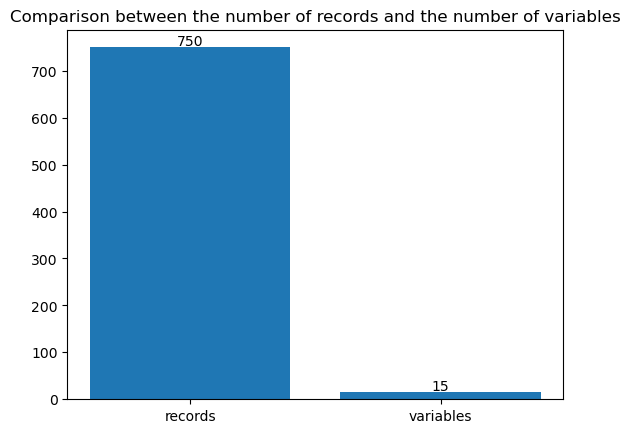

In [3]:
# comparison of the number of records and the number of variables

vertical_bar_shift = 5

plt.figure()
plt.bar(["records", "variables"], [data.shape[0], data.shape[1]])
plt.title("Comparison between the number of records and the number of variables")
plt.text(0, data.shape[0]+vertical_bar_shift, data.shape[0], ha="center")
plt.text(1, data.shape[1]+vertical_bar_shift, data.shape[1], ha="center")
plt.show()

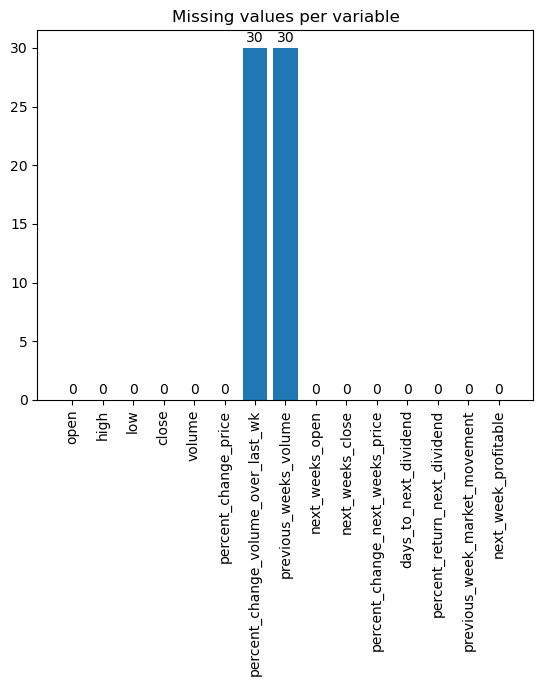

In [4]:
# missing values analysis
vertical_bar_shift = 0.5

mv = {}
for var in data:
    ac = data[var].isna().sum()

    mv[var] = ac

keys = list(mv.keys())
values = list(mv.values())

plt.figure()
plt.bar(keys, values)
plt.title("Missing values per variable")
plt.xticks(rotation=90)
for i in range(data.shape[1]):
    plt.text(i, values[i]+vertical_bar_shift, values[i], ha="center")

plt.show()    

In [5]:
# five number summary of the variables

data.describe()

,open,high,low,close,volume,percent_change_price,percent_change_volume_over_last_wk,previous_weeks_volume,next_weeks_open,next_weeks_close,percent_change_next_weeks_price,days_to_next_dividend,percent_return_next_dividend,previous_week_market_movement,next_week_profitable
count,750.000000,750.000000,750.000000,750.000000,7.500000e+02,750.000000,720.000000,7.200000e+02,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000
mean,53.651840,54.669987,52.640160,53.729267,1.175478e+08,0.050262,5.593627,1.173876e+08,53.702440,53.889080,0.238468,52.525333,0.691826,0.078519,0.516000
std,32.638852,33.215994,32.119277,32.788787,1.584381e+08,2.517809,40.543478,1.592322e+08,32.778111,33.016677,2.679538,46.335098,0.305482,1.374525,0.500077
min,10.590000,10.940000,10.400000,10.520000,9.718851e+06,-15.422900,-61.433175,9.718851e+06,10.520000,10.520000,-15.422900,0.000000,0.065574,-2.391778,0.000000
25%,29.830000,30.627500,28.720000,30.365000,3.086624e+07,-1.288053,-19.804284,3.067832e+07,30.315000,30.462500,-1.222068,24.000000,0.534549,-0.671437,0.000000
50%,45.970000,46.885000,44.800000,45.930000,5.306088e+07,0.000000,0.512586,5.294556e+07,46.015000,46.125000,0.101193,47.000000,0.681067,0.000000,1.000000
75%,72.715000,74.287500,71.037500,72.667500,1.327218e+08,1.650888,21.800622,1.333230e+08,72.715000,72.915000,1.845562,69.000000,0.854291,0.954118,1.000000
max,172.110000,173.540000,167.820000,170.580000,1.453439e+09,9.882230,327.408924,1.453439e+09,172.110000,174.540000,9.882230,336.000000,1.564210,2.962779,1.000000


<Axes: >

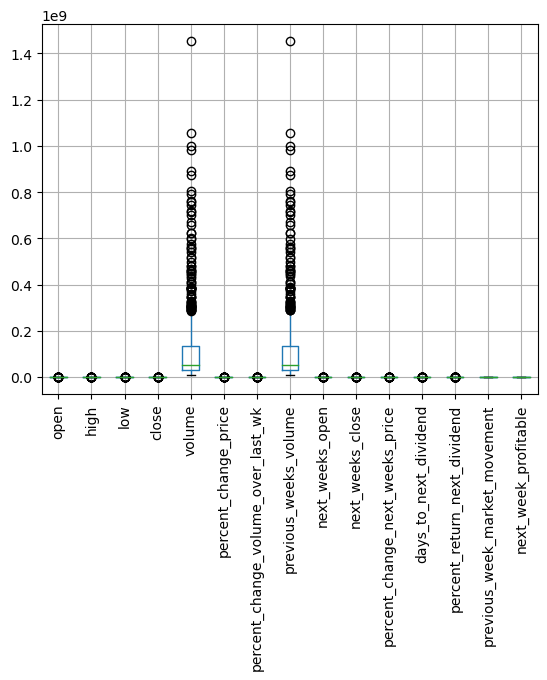

In [6]:
# box plots to analyze the variable ranges

data.boxplot(rot=90)

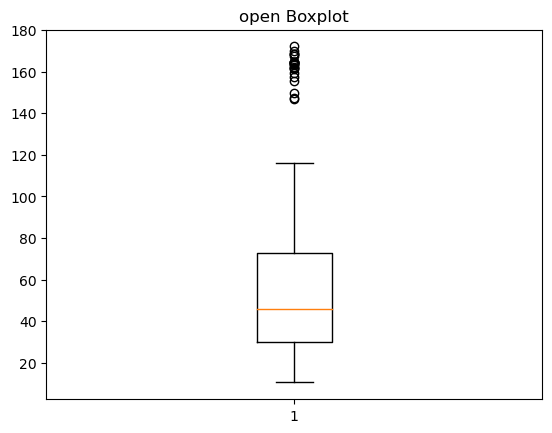

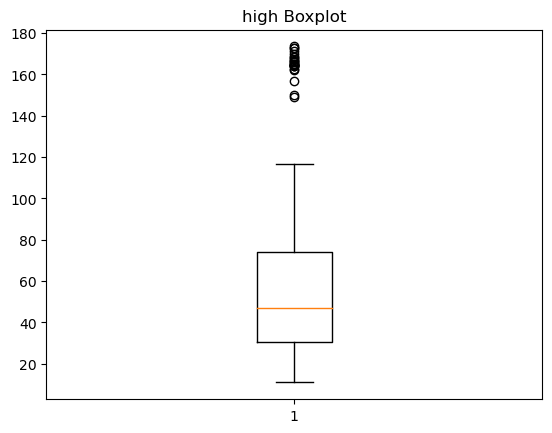

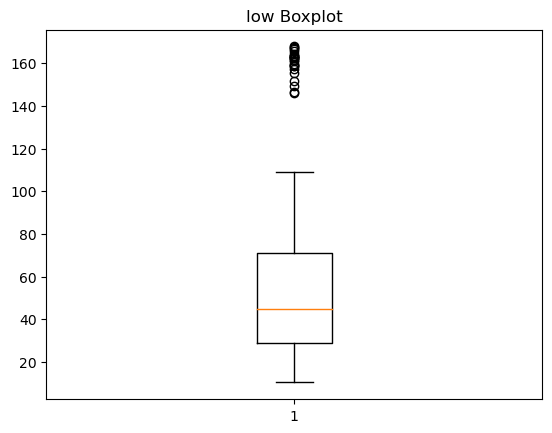

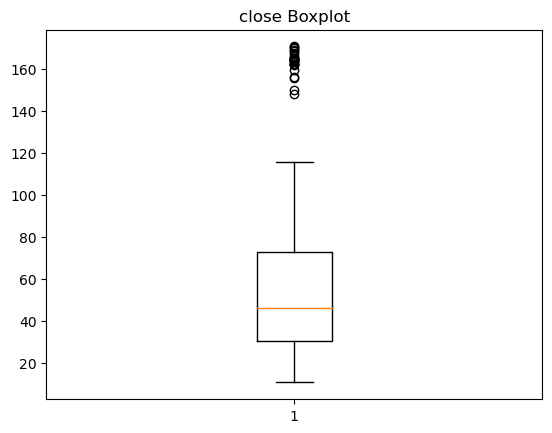

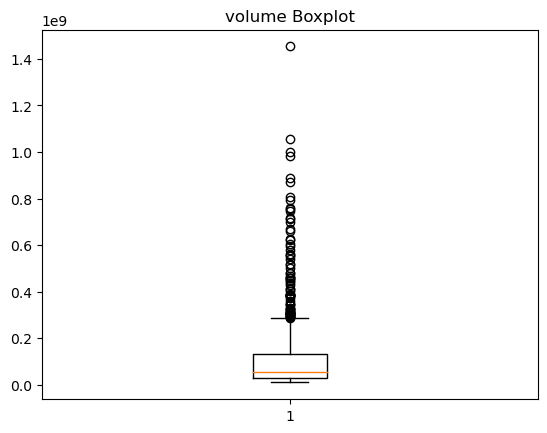

...

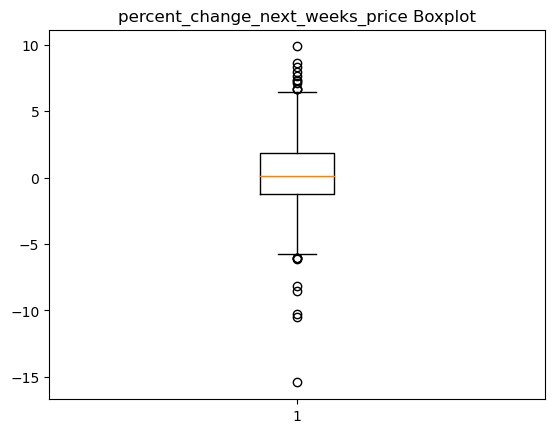

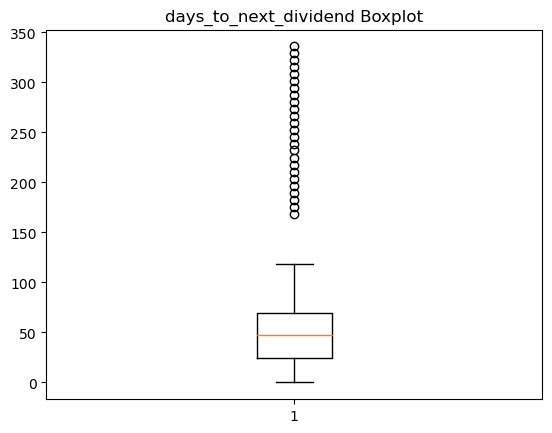

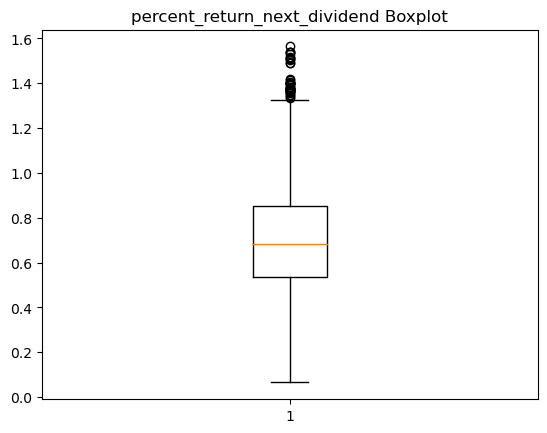

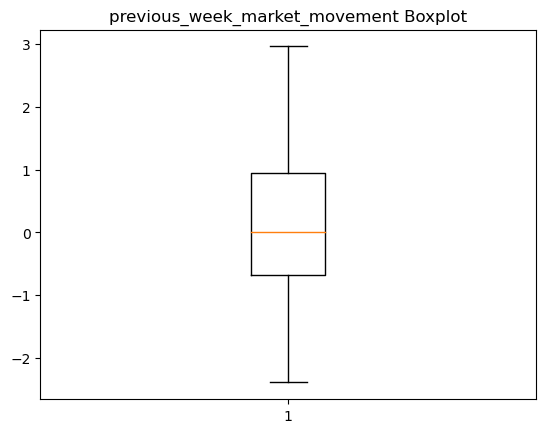

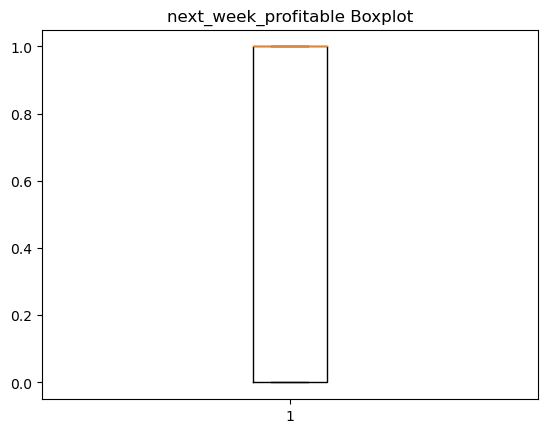

In [7]:
# box plot of the variables to analyze outliers through the IQR criteria

for var in data:
    plt.figure()
    plt.boxplot(data[var].dropna().values)
    plt.title(var + " Boxplot")
    plt.show()

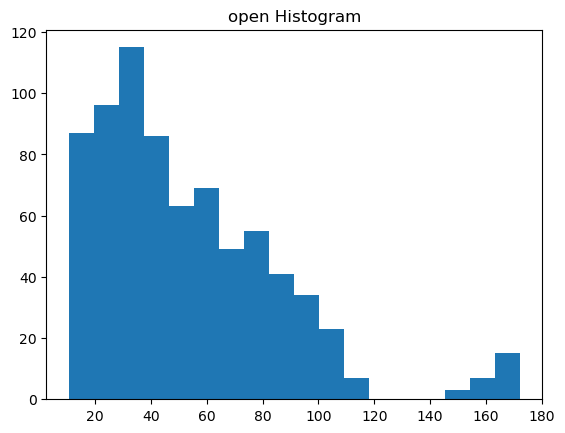

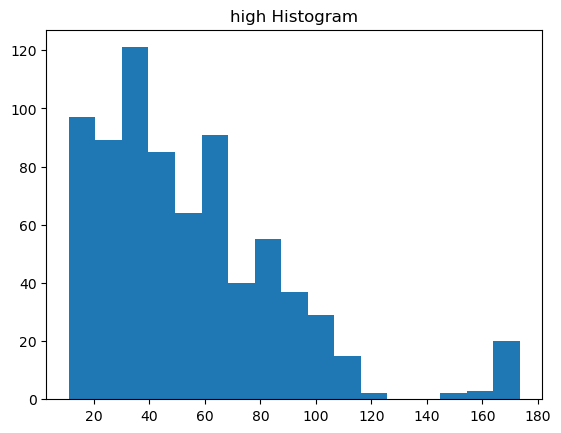

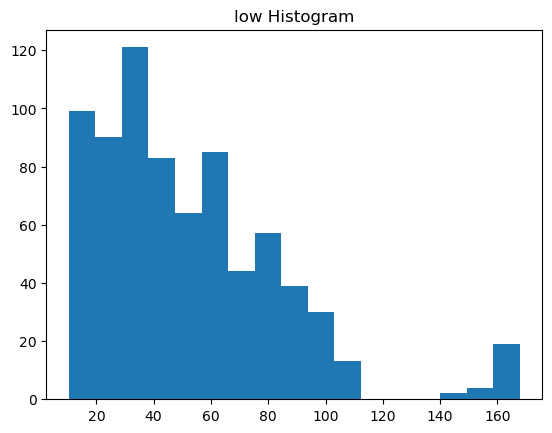

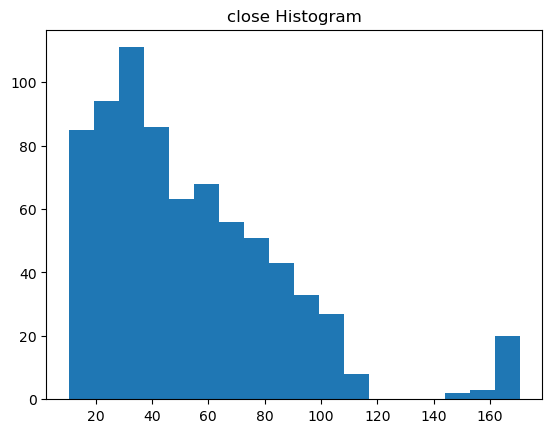

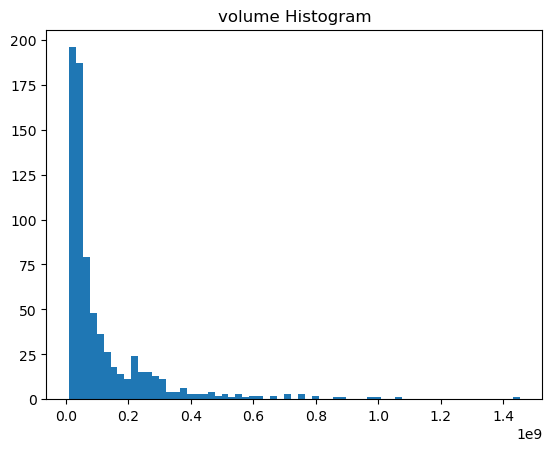

...

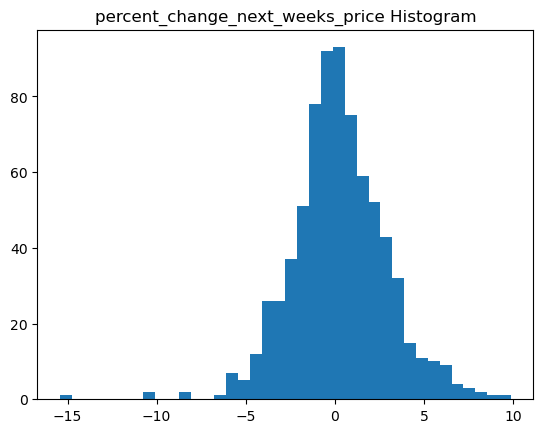

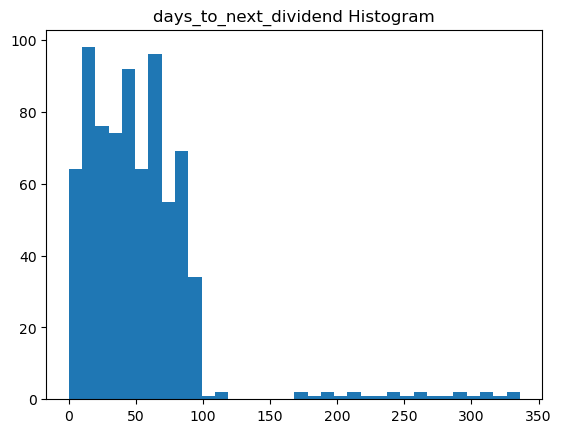

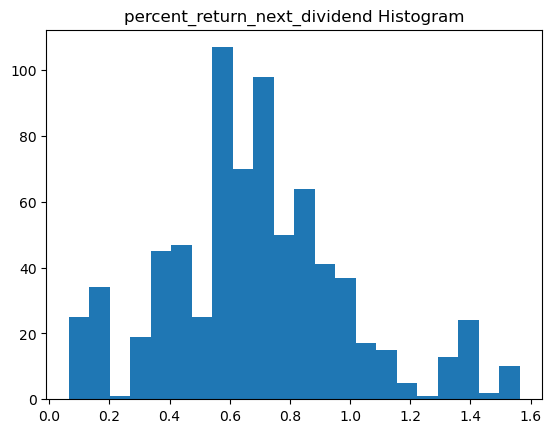

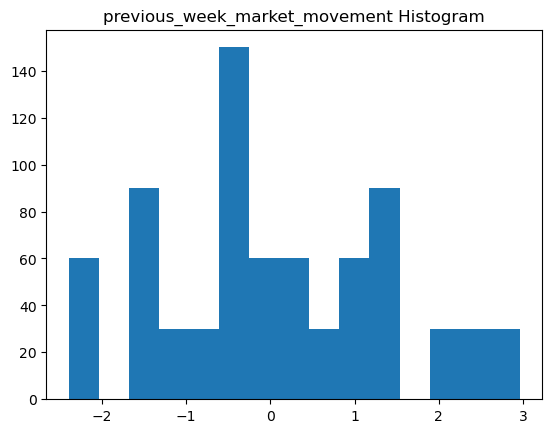

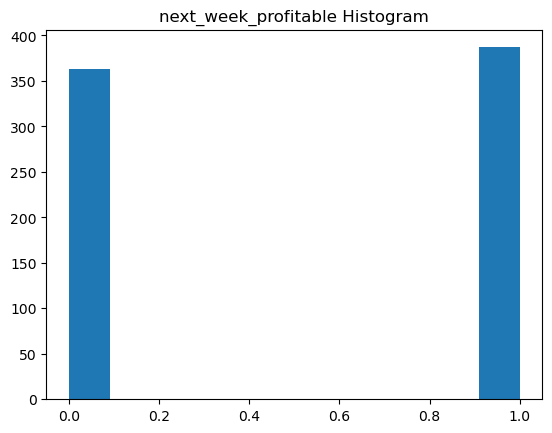

In [8]:
# histogram of each variable to understand the distribution of the values

for var in data:
    plt.figure()
    plt.hist(data[var].dropna().values, bins="auto")
    plt.title(var + " Histogram")
    plt.show()

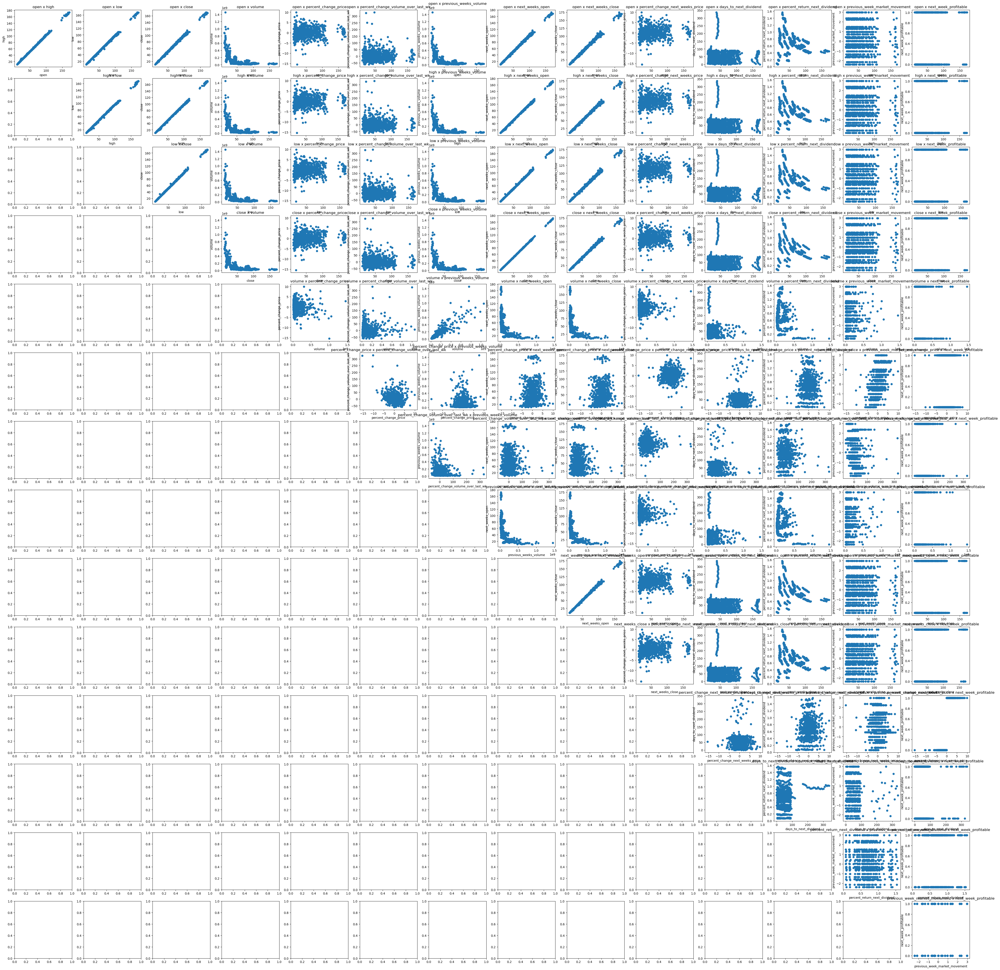

In [9]:
# data sparsity

variables = list(data.columns)

rows, cols = len(variables)-1, len(variables)-1
fig, axs = subplots(rows, cols, figsize=(cols*4, rows*4), squeeze=False)
for i in range(len(variables)):
    var1 = variables[i]
    for j in range(i+1, len(variables)):
        var2 = variables[j]
        axs[i, j-1].set_title("%s x %s"%(var1,var2))
        axs[i, j-1].set_xlabel(var1)
        axs[i, j-1].set_ylabel(var2)
        axs[i, j-1].scatter(data[var1], data[var2])
show()

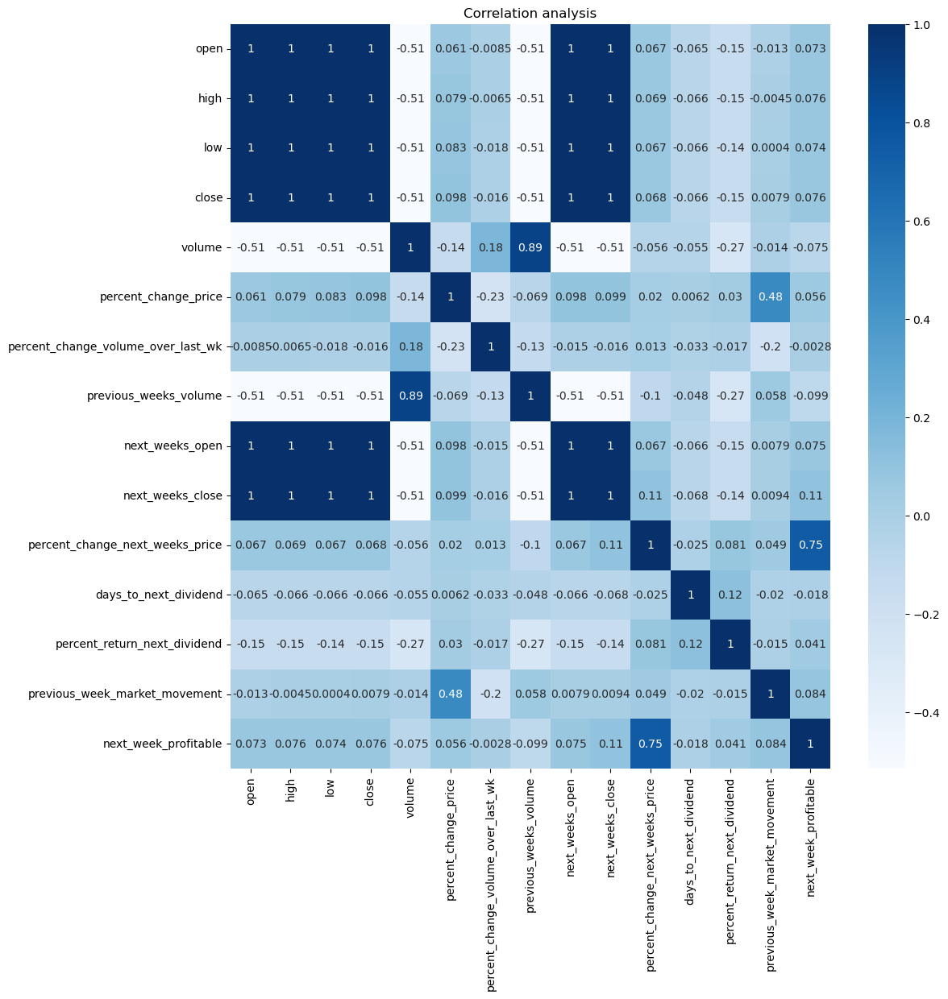

In [10]:
# correlation matrix

corr_mtx = data.corr()

plt.figure(figsize=(12, 12))

heatmap(corr_mtx, xticklabels=corr_mtx.columns, yticklabels=corr_mtx.columns, annot=True, cmap='Blues')
plt.title('Correlation analysis')
plt.show()

In [11]:
# splitting of the dataset
# training set: 1st quarter data
# test set: 2nd quarter data

# 1st quarter 
q1 = data.loc[1].copy()

# 2nd quarter
q2 = data.loc[2].copy()

print(q1)
print(q2)

                   open   high    low  close     volume  percent_change_price  \
stock date                                                                      
AA    2011-01-07  15.82  16.72  15.78  16.42  239655616              3.792670   
      2011-01-14  16.71  16.71  15.64  15.97  242963398             -4.428490   
      2011-01-21  16.19  16.38  15.60  15.79  138428495             -2.470660   
      2011-01-28  15.87  16.63  15.82  16.13  151379173              1.638310   
      2011-02-04  16.18  17.39  16.18  17.14  154387761              5.933250   
...                 ...    ...    ...    ...        ...                   ...   
XOM   2011-02-25  84.97  88.23  84.73  85.34  122018405              0.435448   
      2011-03-04  85.87  86.56  83.55  85.08  102134160             -0.919995   
      2011-03-11  85.84  86.08  80.10  82.12   92727886             -4.333640   
      2011-03-18  81.67  82.64  78.80  80.85  123914255             -1.004040   
      2011-03-25  81.87  83.

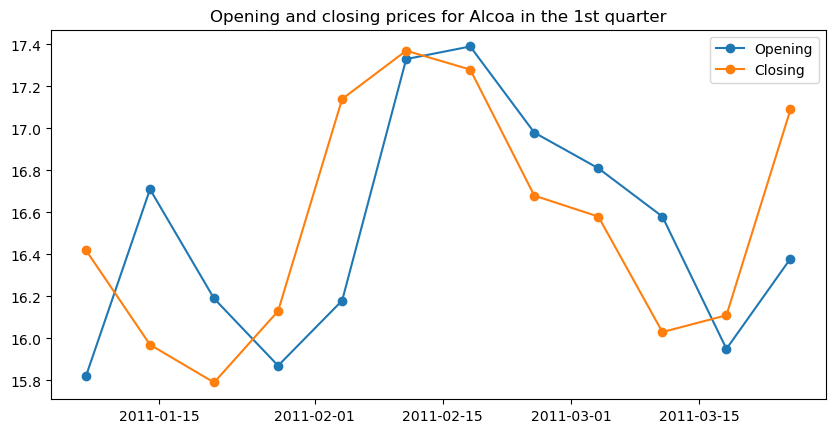

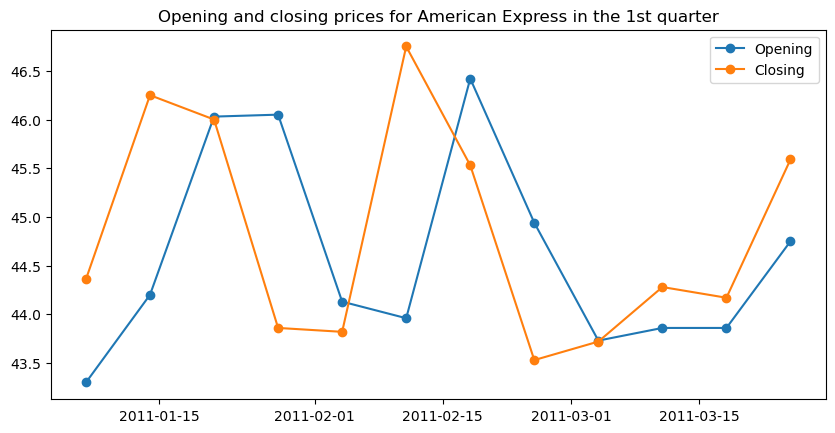

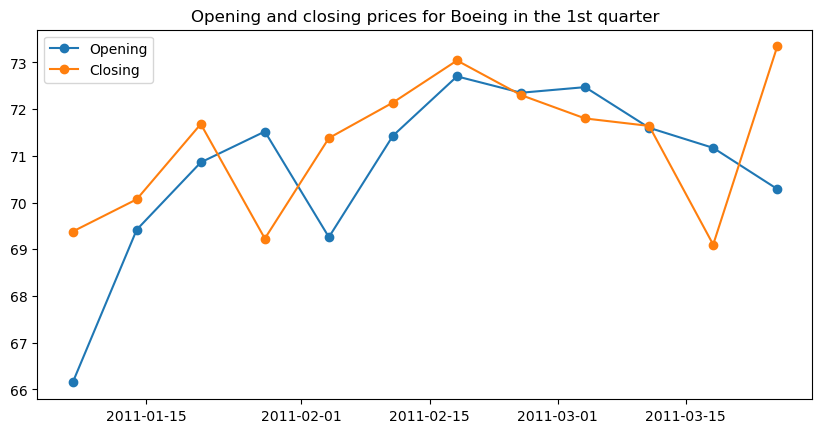

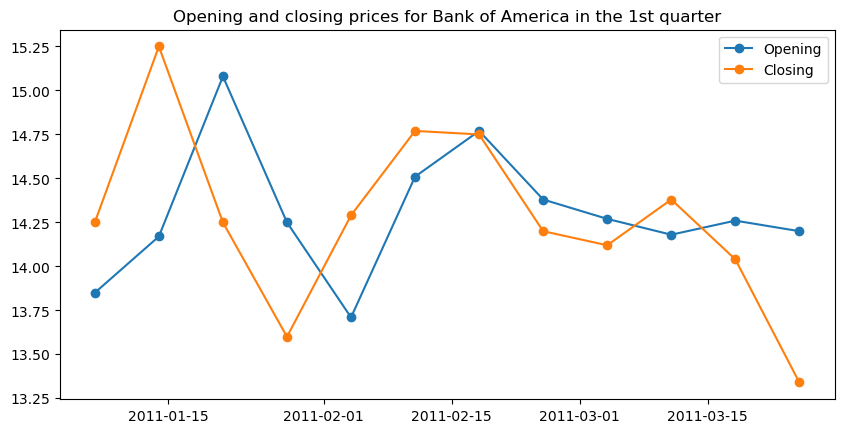

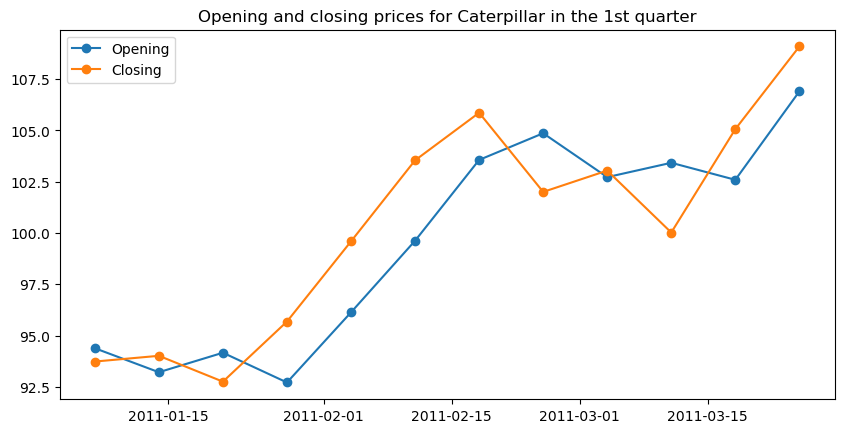

...

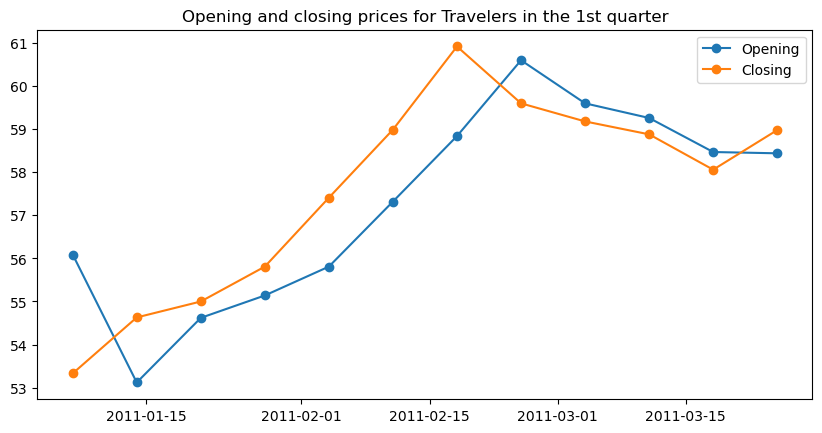

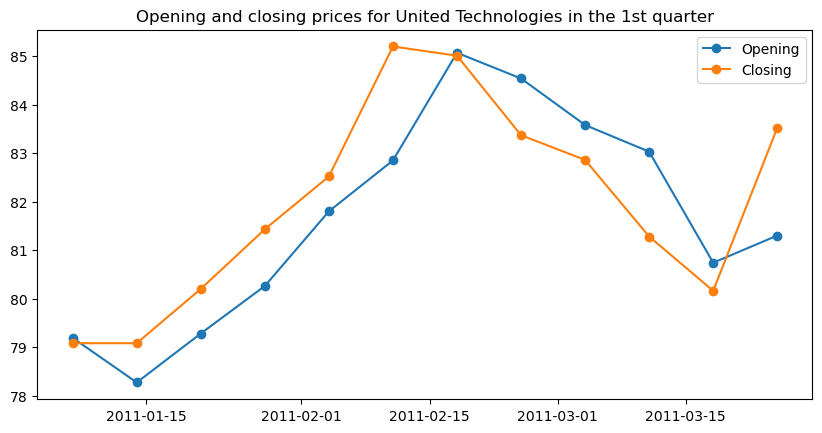

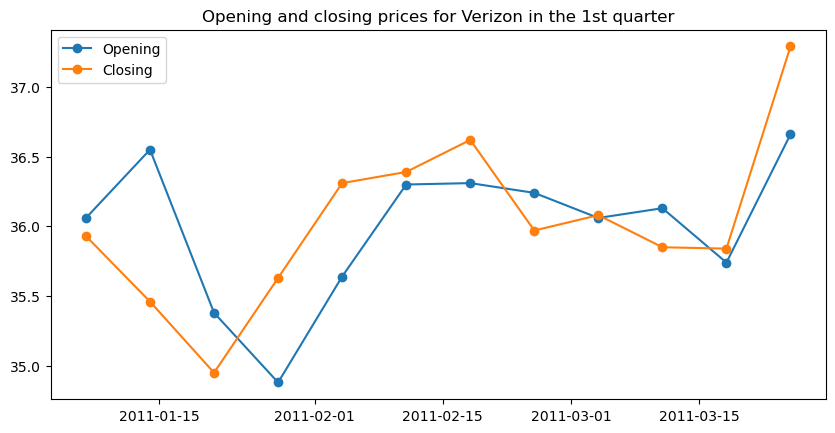

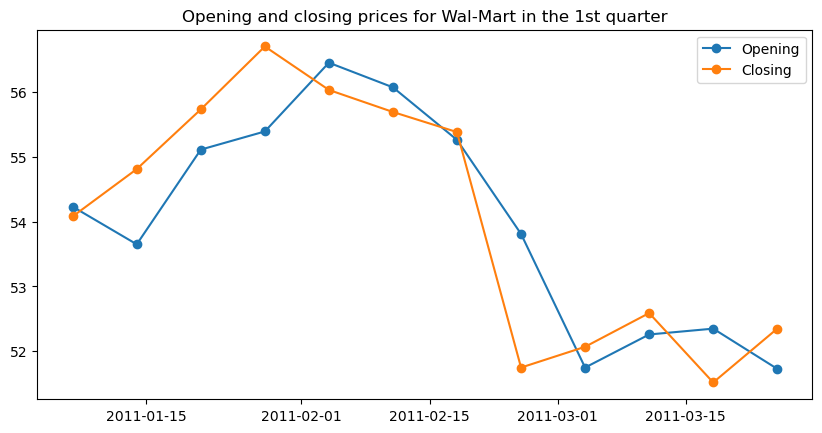

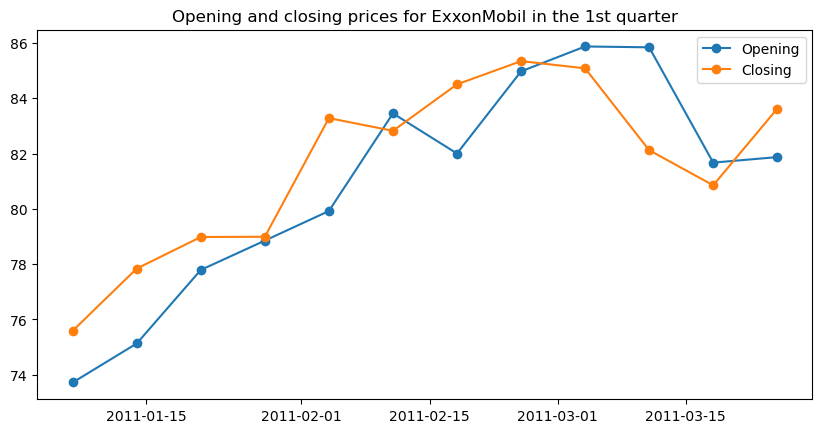

In [12]:
# plot the open and close values of each company in the 1st quarter
company_dict = {
    "MMM": "3M","AXP": "American Express","AA": "Alcoa","T": "AT&T","BAC": "Bank of America","BA": "Boeing","CAT": "Caterpillar","CVX": "Chevron","CSCO": "Cisco Systems","KO": "Coca-Cola","DD": "DuPont","XOM": "ExxonMobil","GE": "General Electric","HPQ": "Hewlett-Packard","HD": "The Home Depot","INTC": "Intel","IBM": "IBM","JNJ": "Johnson & Johnson","JPM": "JPMorgan Chase","KRFT": "Kraft","MCD": "McDonald's","MRK": "Merck","MSFT": "Microsoft","PFE": "Pfizer","PG": "Procter & Gamble","TRV": "Travelers","UTX": "United Technologies","VZ": "Verizon","WMT": "Wal-Mart","DIS": "Walt Disney"
}

idxs = q1.index.values[0::12]

for i in range(0, 30):
    company = idxs[i][0]
    
    plt.figure(figsize=(10,4.8))
    plt.title("Opening and closing prices for " + company_dict[company] + " in the 1st quarter")
    plt.plot(q1.loc[company]["open"], marker="o")
    plt.plot(q1.loc[company]["close"], marker="o")
    plt.legend(["Opening", "Closing"])
    plt.show()

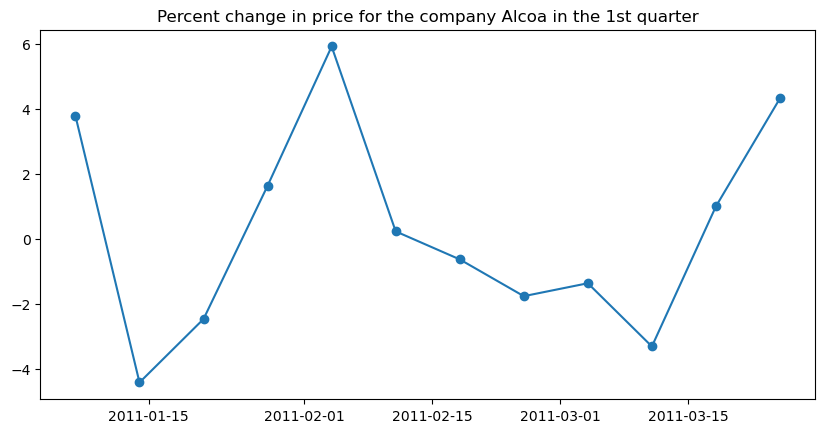

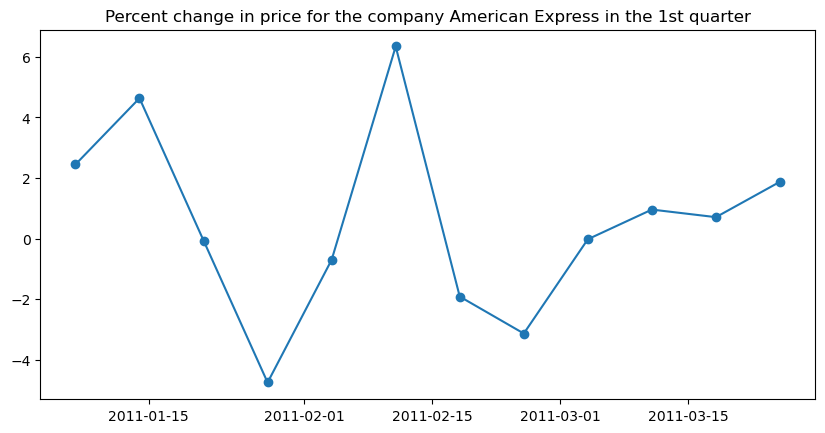

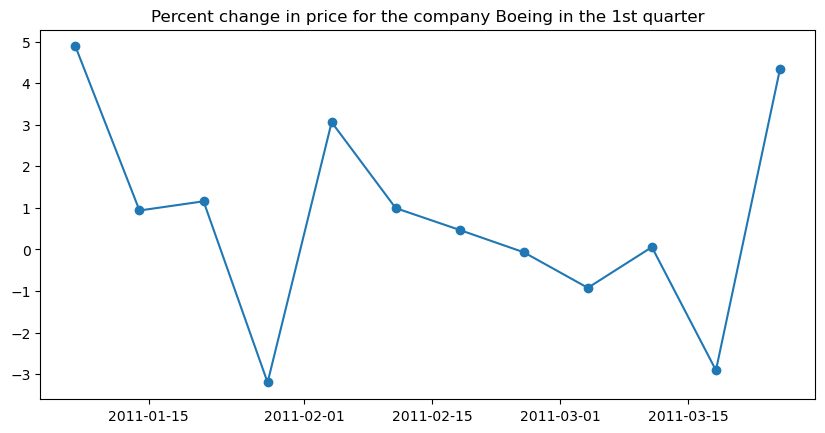

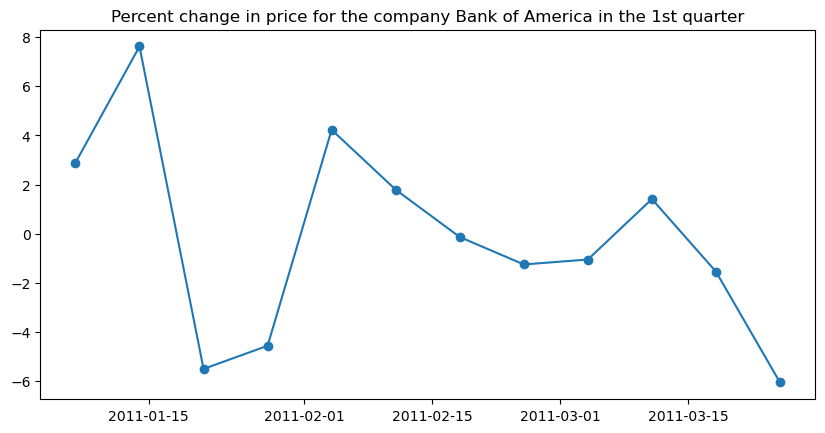

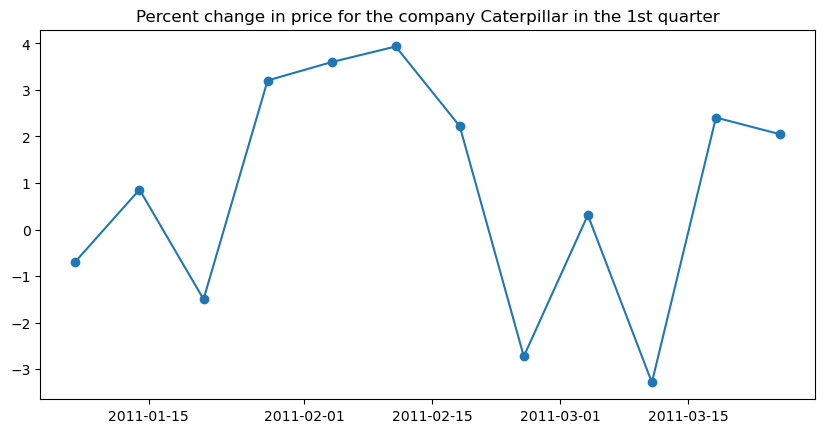

...

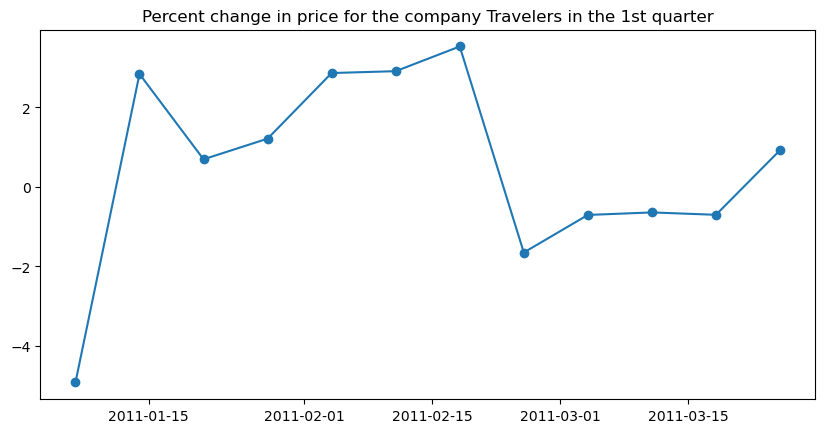

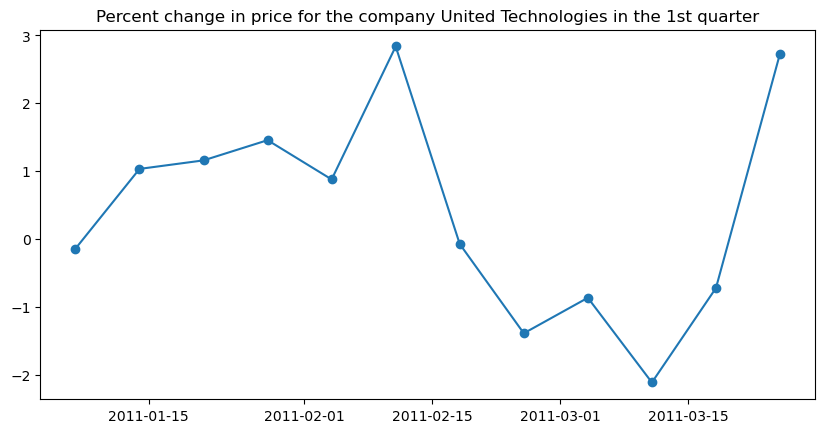

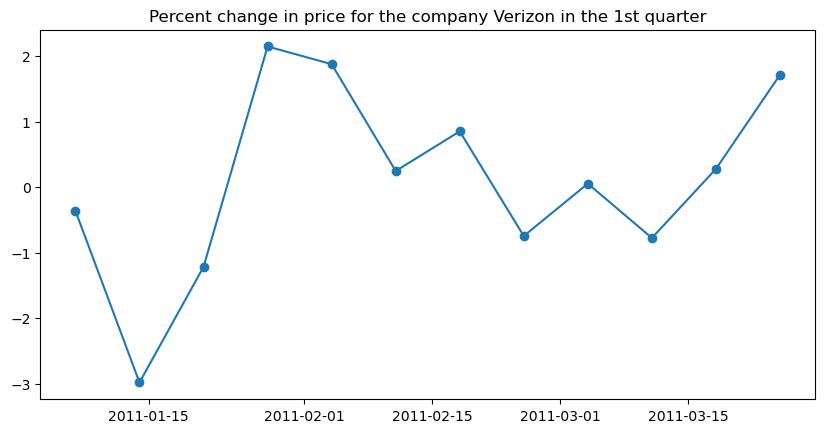

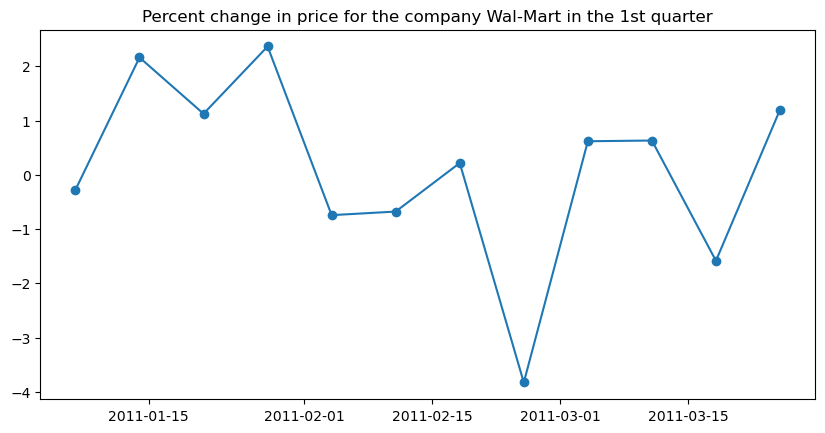

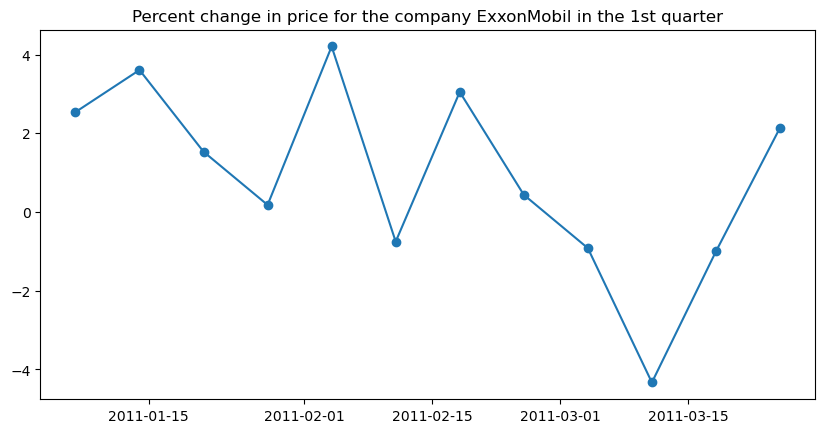

In [13]:
#plot the percent change price of each company in the 1st quarter
idxs = q1.index.values[0::12]

for i in range(0, 30):
    company = idxs[i][0]
    
    plt.figure(figsize=(10,4.8))
    plt.title("Percent change in price for the company " + company_dict[company] + " in the 1st quarter")
    plt.plot(q1.loc[company]["percent_change_price"], marker="o")
    plt.show()

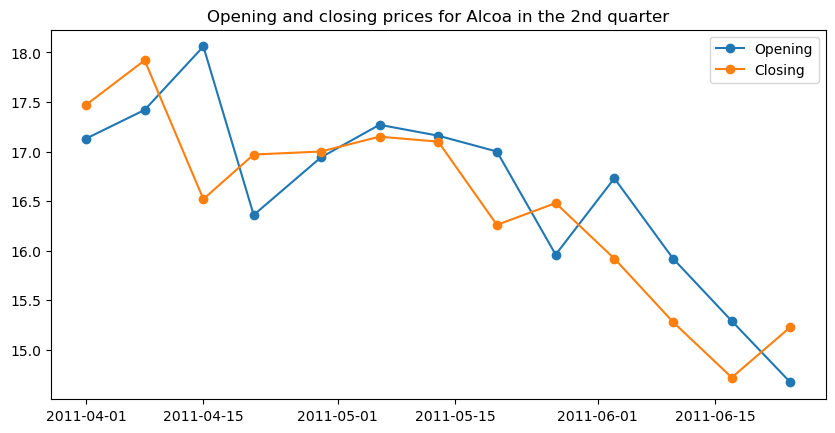

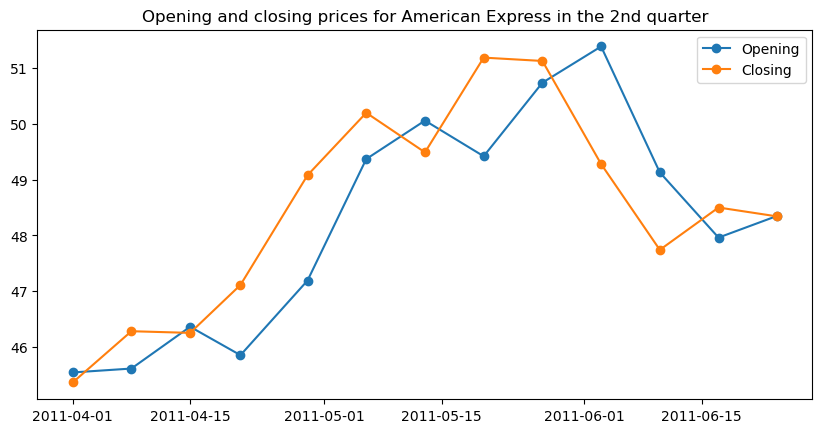

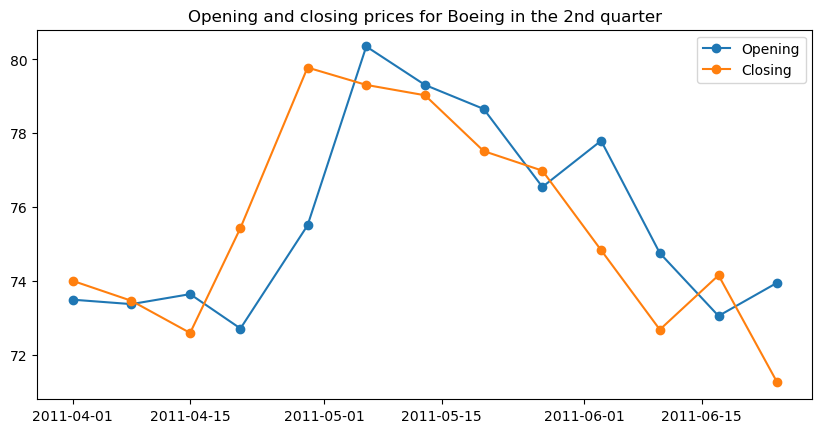

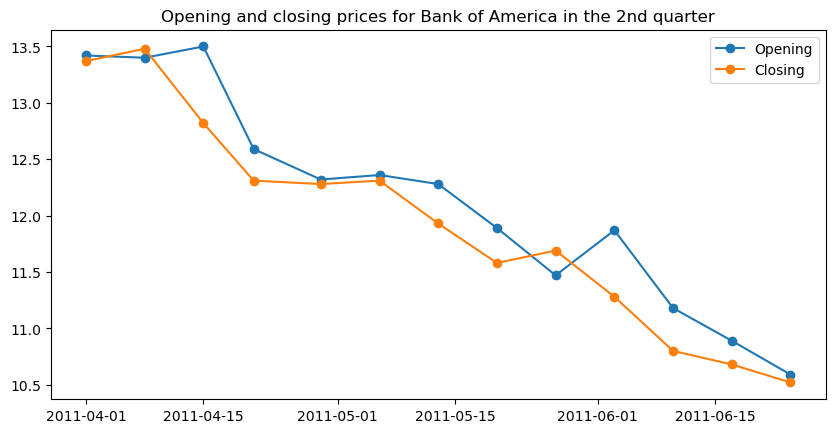

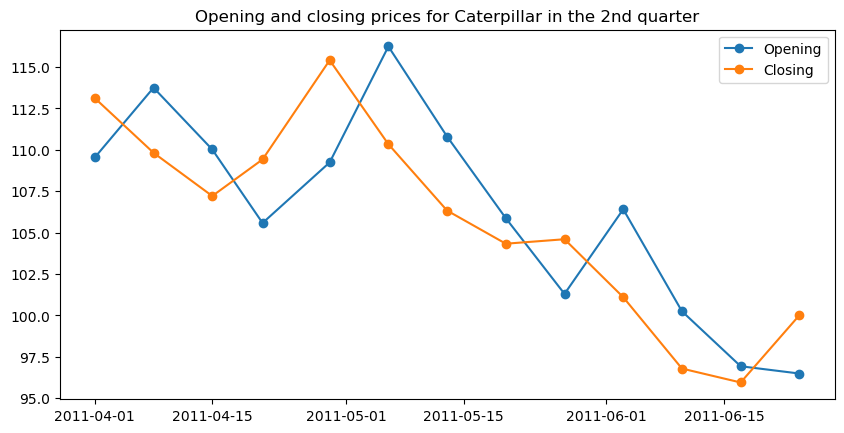

...

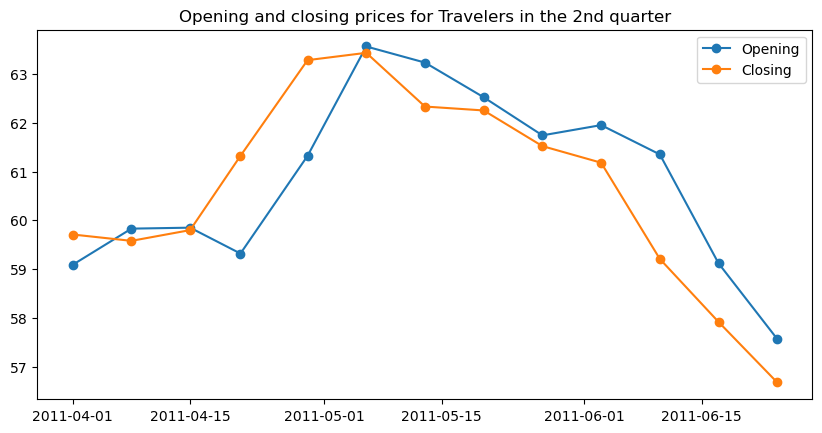

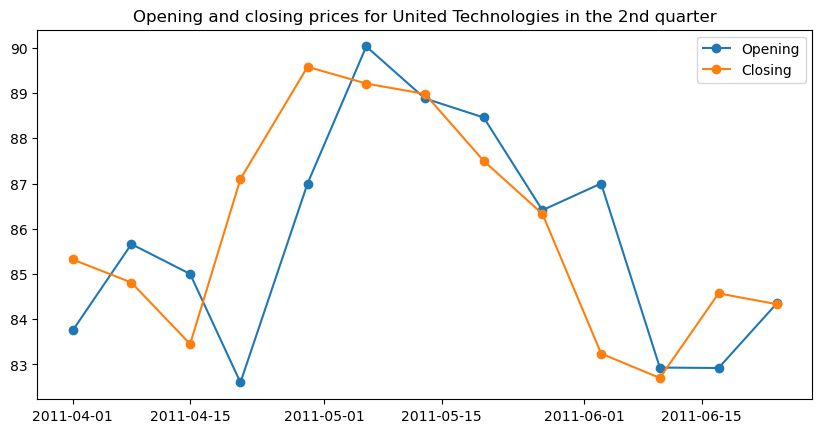

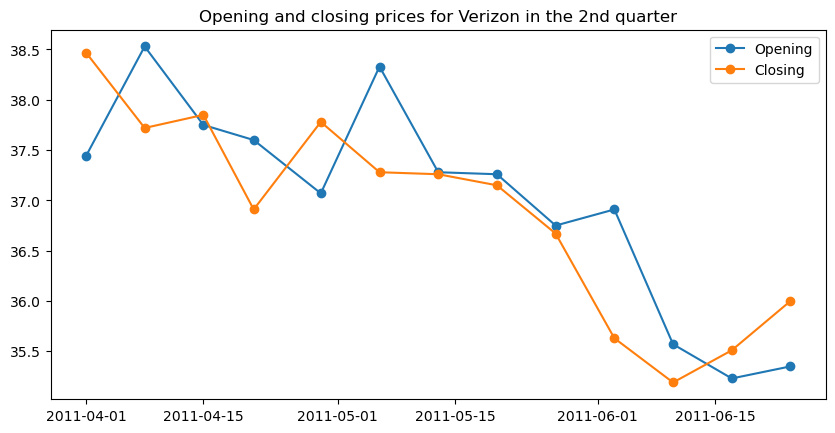

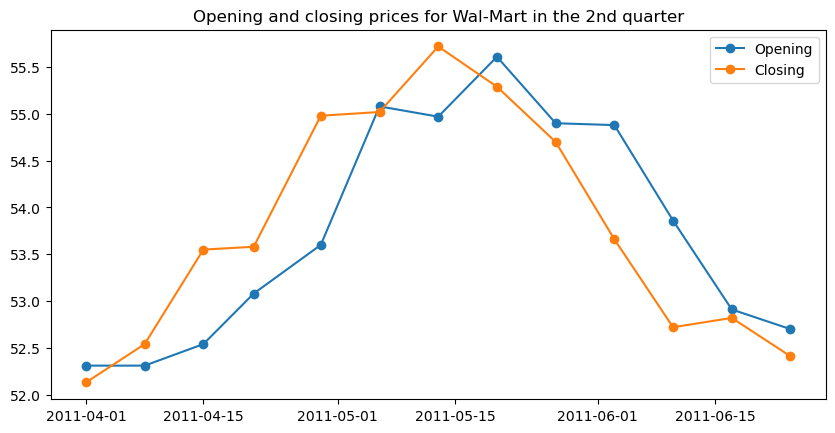

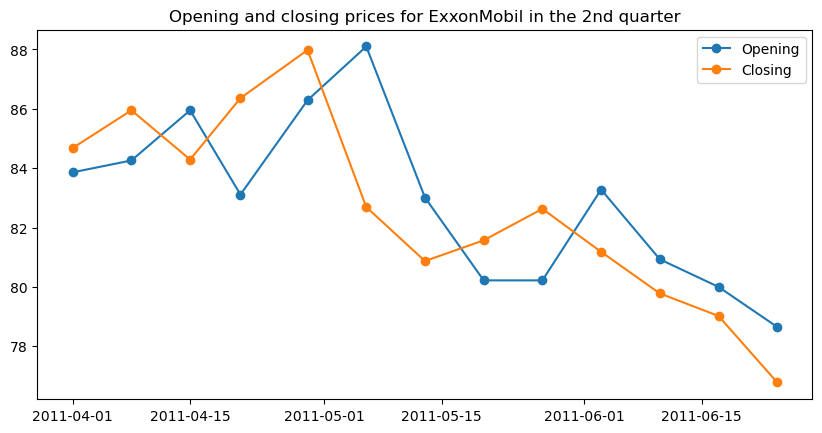

In [14]:
# plot the open and close values of each company in the 2nd quarter
idxs = q2.index.values[0::13]

for i in range(0, 30):
    company = idxs[i][0]
    
    plt.figure(figsize=(10,4.8))
    plt.title("Opening and closing prices for " + company_dict[company] + " in the 2nd quarter")
    plt.plot(q2.loc[company]["open"], marker="o")
    plt.plot(q2.loc[company]["close"], marker="o")
    plt.legend(["Opening", "Closing"])
    plt.show()

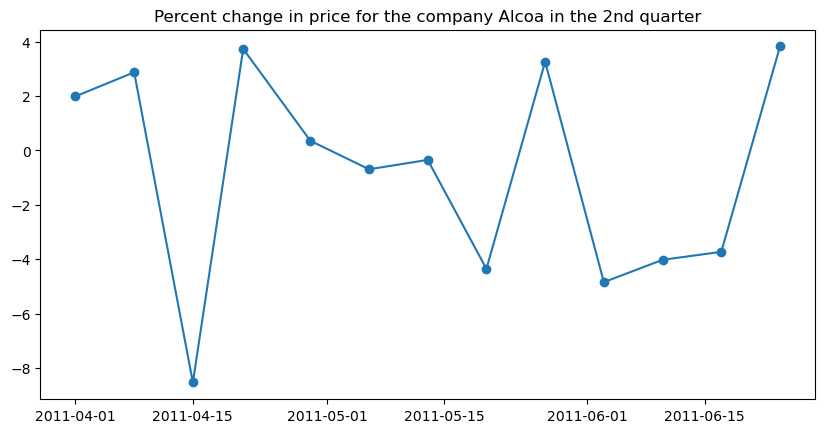

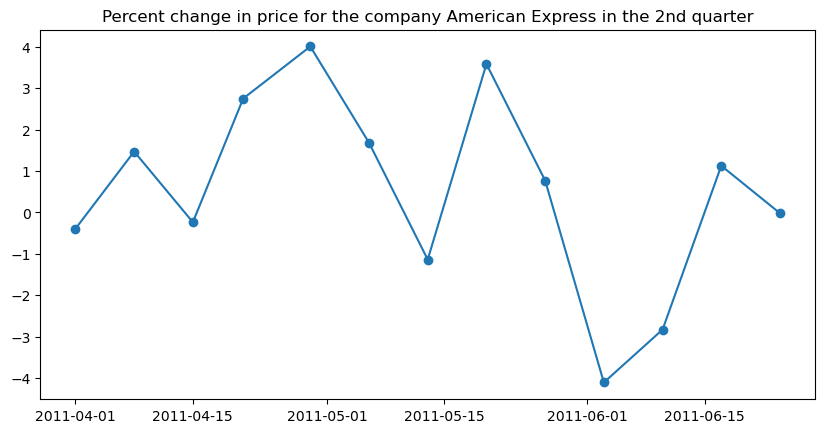

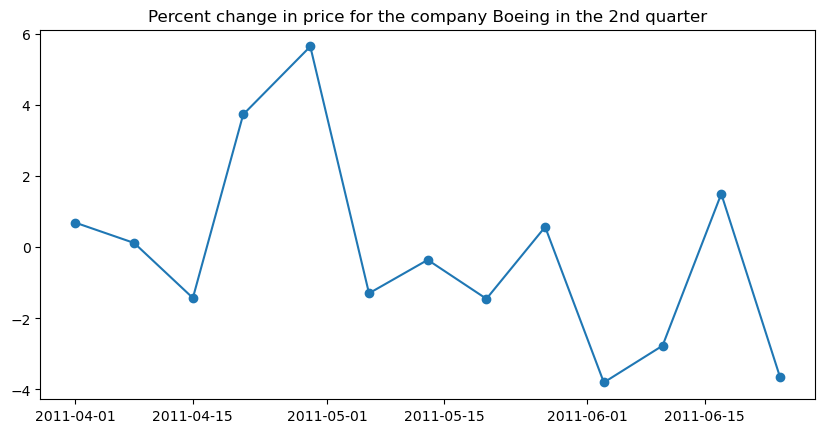

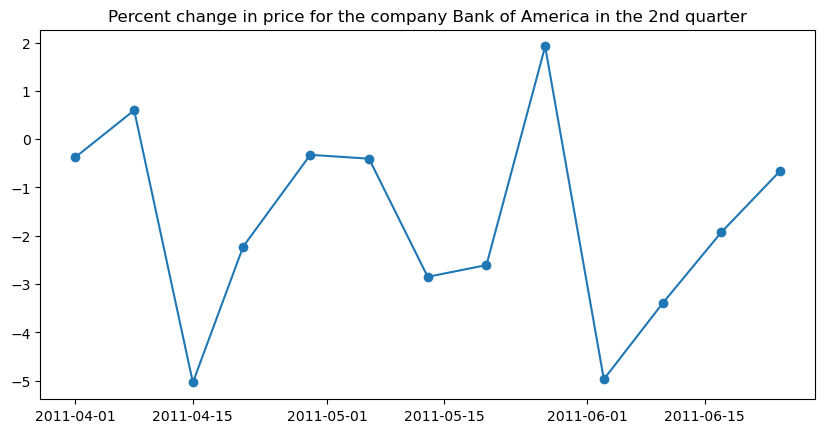

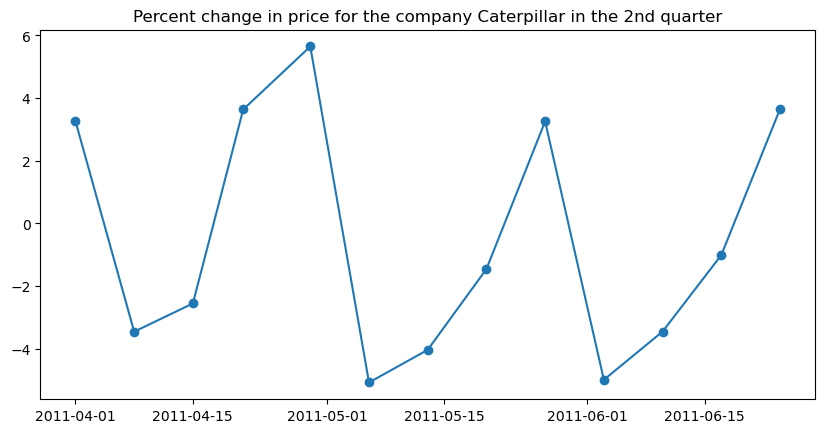

...

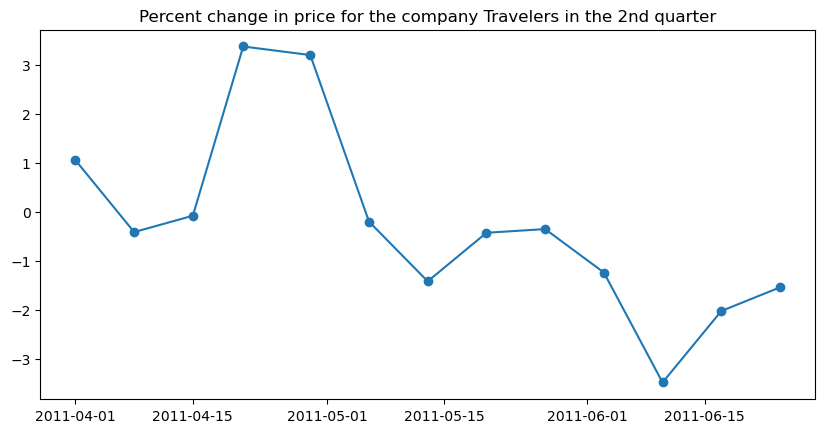

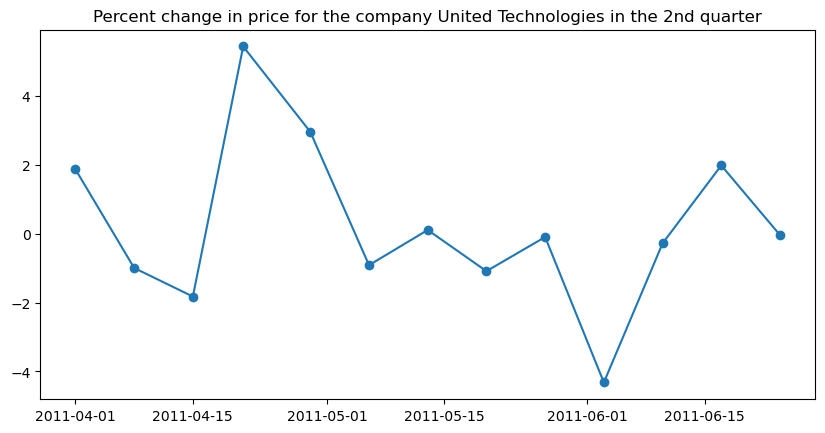

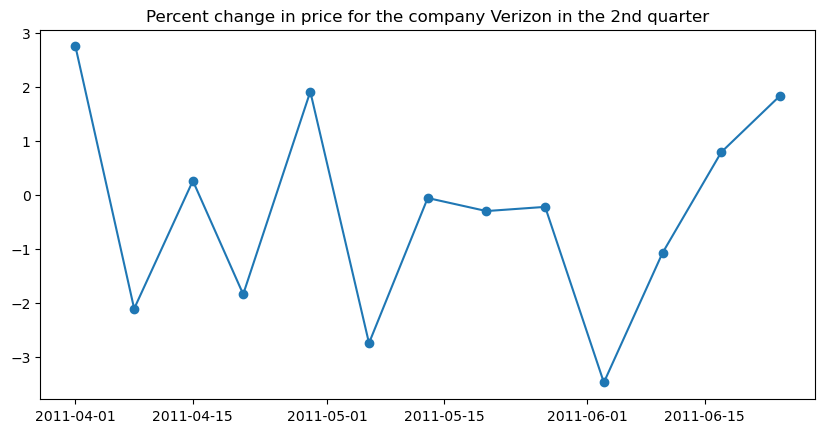

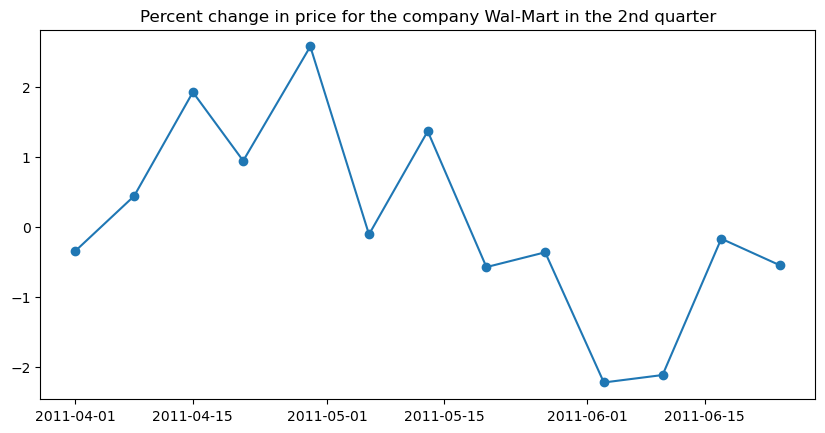

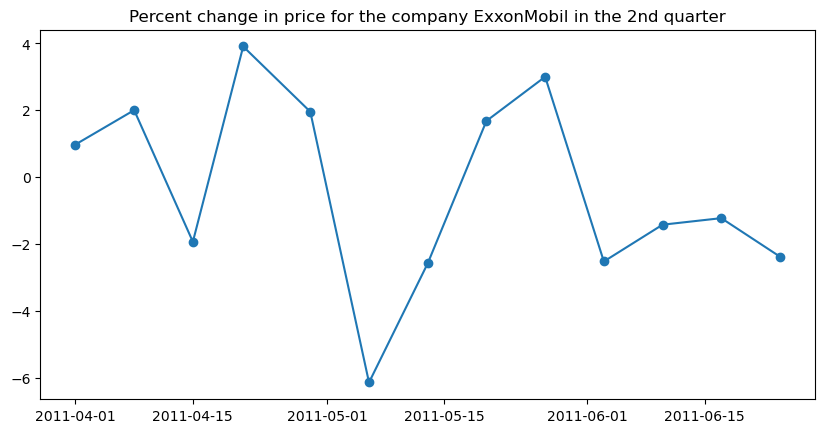

In [15]:
#plot the percent change price of each company in the 2nd quarter
idxs = q2.index.values[0::13]

for i in range(0, 30):
    company = idxs[i][0]
    
    plt.figure(figsize=(10,4.8))
    plt.title("Percent change in price for the company " + company_dict[company] + " in the 2nd quarter")
    plt.plot(q2.loc[company]["percent_change_price"], marker="o")
    plt.show()

In [16]:
from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler

# choosen variables to consider during the training and prediction phase of the models
predictors = ["open", 
              "close", 
              "high", 
              "low", 
              "volume", 
              "percent_change_price", 
              "days_to_next_dividend", 
              "percent_return_next_dividend"
              ]

# scale the variables since they present different ranges (see the boxplots)

q1_unscaled = q1.copy()
q2_unscaled = q2.copy()

scaler = StandardScaler()
#scaler = Normalizer()
#scaler = MinMaxScaler()

q1[predictors] = scaler.fit_transform(q1[predictors])
q2[predictors] = scaler.fit_transform(q2[predictors])

train = q1
test = q2

In [17]:
#add here your data understanting code

-----
*Add here your data understanding findings and conclusions (max. 200 words)*
-----

After analyzing the variables available, I decided to create two new variables. The first one was a market movement variable that is calculated as follows:

$$
market\_movement(week) = \frac{sum\_closes(week) - sum\_closes(week-1)}{sum\_closes(week)} * 100
$$

Where sum_closes(week) gives the sum of the closing price of all the stocks on a certain week.
The market movement variable was created to gather information if the prices of the majority of the stocks were going upwards or downwards.

Additionaly, since I decided to follow a classification approach, I created a variable called next_week_profitable which is 1 when the closing price of the stock is greater than the opening price of the stock on the following week, and 0 otherwise. This is the target variable used to train and test the models.

The features used to train the system where: 
* **"open"** 
* **"close"** 
* **"high"** 
* **"low"** 
* **"volume"** 
* **"percent_change_price"** 
* **"days_to_next_dividend"** 
* **"percent_return_next_dividend"**
* **"previous_week_market_movement"**

After analyzing the dataset, I found that 30 values were missing on percent_change_volume_over_last_wk and previous_weeks_volume. This was not relevant since I did not use these variables on the training and testing of the models.

Furthermore, after plotting the boxplot of the variables, I found that the range of the variables were quite different. With this I decided to perform a scaling operation before training the models. With the box plots, I also noted that some variables had values that could be considered outliers, trough the IQR criteria, but decided to not remove them. For example, the opening price of the stocks were very different but this was not an outlier.

Moreover, I tried to find correlations between the variables but only obvious ones like percent_change_next_weeks_price and next_week_profitable appeared. This correlation could not be used since it uses the information that we are trying to predict.

Finally, I decided to divide the dataset as follows:
* **Training Set**: 1st quarter data
* **Test Set**: 2nd quarter data


## Modelling
In this phase, your main goal is to develop and describe your approach to the solution of the problem. Some guidelines to help you:
* What metrics will you use to evaluate your solutions?
* What are some algorithms that can lead to good results? And why?
* Describe in detail your thought process during the development of your solution.
* Present your results.


-----


In [18]:
#add here your modelling code
from sklearn.metrics import accuracy_score, recall_score, precision_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

def find_best_forest(train, test, predictors, max_features, max_depths, n_estimators):
    # returns the random forest with the highest precision
    
    best_model = None
    best_precision = 0
    best_settings= (0,0,0)
    
    for nf in range(len(max_features)):
        f = max_features[nf]
        values = {}
        for d in max_depths:
            yvalues = []
            for n in n_estimators:
                model = RandomForestClassifier(max_features=f, max_depth=d, n_estimators=n)
                model.fit(train[predictors], train["next_week_profitable"])
                preds = model.predict(test[predictors])
                yvalues.append(precision_score(test["next_week_profitable"], preds))
                if yvalues[-1] > best_precision:
                    best_precision = yvalues[-1]
                    best_model = model
                    best_settings = (f, d, n)
            values[d] = yvalues
            
        plt.figure(figsize=(10,4.8))
        plt.title("Random Forest with " + str(f) + " max_features")
        for d in range(len(max_depths)):
            plt.plot(n_estimators, values[max_depths[d]])
        plt.xlabel("n_estimators")
        plt.xticks(n_estimators)
        plt.legend(max_depths)
        plt.show()
        
    print("The best model achieved a precision of {} with following settings: \n max_features: {}\n max_depth: {}\n n_estimators: {}".format(round(best_precision, 3), *best_settings) )
    return best_model

def find_best_KNN(train, test, predictors, kvalues):
    # returns the KNN model with the highest precision
    
    best_model = None
    best_precision = 0
    best_settings = 0
    
    yvalues = []
    for k in kvalues:
        model = KNeighborsClassifier(n_neighbors=k)
        model.fit(train[predictors], train["next_week_profitable"])
        preds = model.predict(test[predictors])
        yvalues.append(precision_score(test["next_week_profitable"], preds))
        if yvalues[-1] > best_precision:
            best_precision = yvalues[-1]
            best_model = model
            best_settings = k

    plt.figure(figsize=(10,4.8))
    plt.title("KNN comparison")
    
    plt.plot(kvalues, yvalues)
    plt.xlabel("neighbors")
    plt.xticks(kvalues)
    plt.show()
    
    print("The best model achieved a precision of {} with following settings: \n kvalues: {}".format(round(best_precision, 3), best_settings))
    return best_model

def find_best_NB(train, test, predictors):
    # returns the Naive Bayes with the highest precision
    
    best_model = None
    best_precision = 0
    best_settings = ""
    models = {"Gaussian": GaussianNB(), "Bernoulli": BernoulliNB()}
    
    yvalues = []
    for model in models:
        models[model].fit(train[predictors], train["next_week_profitable"])
        preds = models[model].predict(test[predictors])
        yvalues.append(precision_score(test["next_week_profitable"], preds))
        if yvalues[-1] > best_precision:
            best_precison = yvalues[-1]
            best_model = models[model]
            
    plt.figure()

    plt.bar(list(models.keys()), yvalues)
    plt.title("Comparison of Naive Bayes")
    vertical_bar_shift = 0.01
    for i in range(len(models)):
        plt.text(i, yvalues[i]+vertical_bar_shift, round(yvalues[i], 3), ha="center")

    plt.show() 
    
    return best_model

def find_best_tree(train, test, predictors, min_impurity_decrease, max_depths, criteria):
    # returns the decision tree with the highest precision
    
    best_model = None
    best_precision = 0
    best_settings= (0,0,0)
    
    for cf in range(len(criteria)):
        c = criteria[cf]
        values = {}
        for d in max_depths:
            yvalues = []
            for imp in min_impurity_decrease:
                model = DecisionTreeClassifier(criterion=c, max_depth=d, min_impurity_decrease=imp)
                model.fit(train[predictors], train["next_week_profitable"])
                preds = model.predict(test[predictors])
                yvalues.append(precision_score(test["next_week_profitable"], preds))
                if yvalues[-1] > best_precision:
                    best_precision = yvalues[-1]
                    best_model = model
                    best_settings = (c, d, imp)
            values[d] = yvalues
            
        plt.figure(figsize=(10,4.8))
        plt.title("Decision Tree with " + c + " criteria")
        for d in range(len(max_depths)):
            plt.plot(min_impurity_decrease, values[max_depths[d]])
        plt.xlabel("min_impurity_decrease")
        plt.xticks(min_impurity_decrease)
        plt.legend(max_depths)
        plt.show()
    print("The best model achieved a precision of {} with following settings: \n criteria: {}\n max_depth: {}\n min_impurity_decrease: {}".format(round(best_precision, 3), *best_settings) )
    return best_model

def find_best_nn(train, test, predictors, lr_type, max_iter, learning_rate):
    # returns the MLP with the highest precision
    
    best_model = None
    best_precision = 0
    best_settings= ("",0,0)
    
    for l in range(len(lr_type)):
        lt = lr_type[l]
        values = {}
        for lr in learning_rate:
            yvalues = []
            for n in max_iter:
                model = MLPClassifier(learning_rate=lt, learning_rate_init=lr, max_iter=n)
                model.fit(train[predictors], train["next_week_profitable"])
                preds = model.predict(test[predictors])
                yvalues.append(precision_score(test["next_week_profitable"], preds, zero_division=0))
                if yvalues[-1] > best_precision:
                    best_precision = yvalues[-1]
                    best_model = model
                    best_settings = (lt, lr, n)
            values[lr] = yvalues
            
        plt.figure(figsize=(10,4.8))
        plt.title("MLP with " + lt + " as the learning type")
        for lr in range(len(learning_rate)):
            plt.plot(max_iter, values[learning_rate[lr]])
        plt.xlabel("max_iter")
        plt.xticks(max_iter)
        plt.legend(learning_rate)
        plt.show()
    print("The best model achieved a precision of {} with following settings: \n learning_type: {}\n learning_rate: {}\n max_iter: {}".format(round(best_precision, 3), *best_settings) )
    return best_model

def find_best_boosting(train, test, predictors, n_estimators, max_depths, learning_rate):
    # returns the GradientBoosting model with the highest precision
    
    best_model = None
    best_precision = 0
    best_settings= (0,0,0)
    
    for md in range(len(max_depths)):
        d = max_depths[md]
        values = {}
        for lr in learning_rate:
            yvalues = []
            for n in n_estimators:
                model = GradientBoostingClassifier(n_estimators=n, learning_rate=lr, max_depth=d)
                model.fit(train[predictors], train["next_week_profitable"])
                preds = model.predict(test[predictors])
                yvalues.append(precision_score(test["next_week_profitable"], preds))
                if yvalues[-1] > best_precision:
                    best_precision = yvalues[-1]
                    best_model = model
                    best_settings = (d, lr, n)
            values[lr] = yvalues
            
        plt.figure(figsize=(10,4.8))
        plt.title("GradientBoosting with " + str(max_depths[md]) + " as the max_depth")
        for lr in range(len(learning_rate)):
            plt.plot(n_estimators, values[learning_rate[lr]])
        plt.xlabel("n_estimators")
        plt.xticks(n_estimators)
        plt.legend(learning_rate)
        plt.show()
    print("The best model achieved a precision of {} with following settings: \n max_depth: {}\n learning_rate: {}\n n_estimators: {}".format(round(best_precision, 3), *best_settings) )
    return best_model
    
    
def predict(train, test, predictors, model):   
    # prints the multiple metrics on the training and testing sets
    # returns the test set predictions
    
    preds = model.predict(train[predictors])
    preds = pd.Series(preds, index=train.index)
    
    metrics = ["Accuracy", "Precision", "Recall"]
    values = [accuracy_score(train["next_week_profitable"], preds), precision_score(train["next_week_profitable"], preds), recall_score(train["next_week_profitable"], preds)]
    cm = confusion_matrix(train["next_week_profitable"], preds)
    
    print("Confusion Matrix on the training dataset: ", cm)
    print(ConfusionMatrixDisplay(cm, display_labels=model.classes_).plot())
    
    plt.figure()
    plt.bar(metrics, values)
    plt.title("Model Evaluation on the training dataset")
    vertical_bar_shift = 0.01
    for i in range(len(metrics)):
        plt.text(i, values[i]+vertical_bar_shift, round(values[i], 3), ha="center")
    
    plt.show()
    
    preds = model.predict(test[predictors])
    preds = pd.Series(preds, index=test.index)
    
    metrics = ["Accuracy", "Precision", "Recall"]
    values = [accuracy_score(test["next_week_profitable"], preds), precision_score(test["next_week_profitable"], preds), recall_score(test["next_week_profitable"], preds)]
    cm = confusion_matrix(test["next_week_profitable"], preds)
    
    print("Confusion Matrix on the testing dataset: ", cm)
    print(ConfusionMatrixDisplay(cm, display_labels=model.classes_).plot())
    
    plt.figure()

    plt.bar(metrics, values)
    plt.title("Model Evalution on the testing dataset")
    vertical_bar_shift = 0.01
    for i in range(len(metrics)):
        plt.text(i, values[i]+vertical_bar_shift, round(values[i], 3), ha="center")

    plt.show()   
    
    return preds

In [19]:
# list that stores the best version of each model
best_models = []

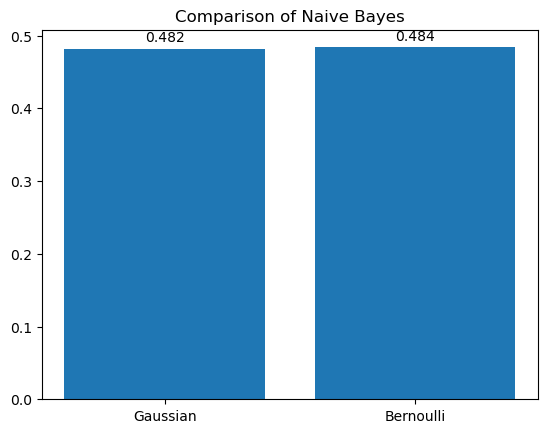

In [20]:
# Naive Bayes
model = find_best_NB(train, test, predictors)

Confusion Matrix on the training dataset:  [[ 89  68]
 [ 94 109]]


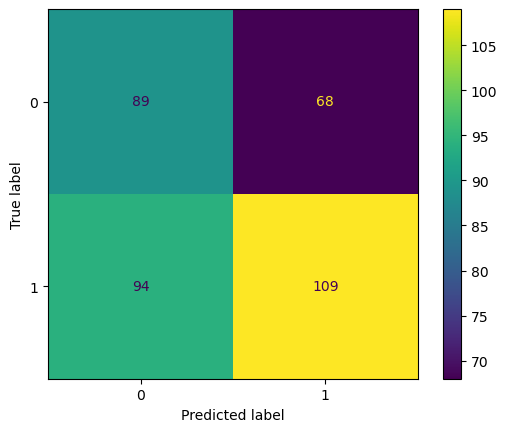

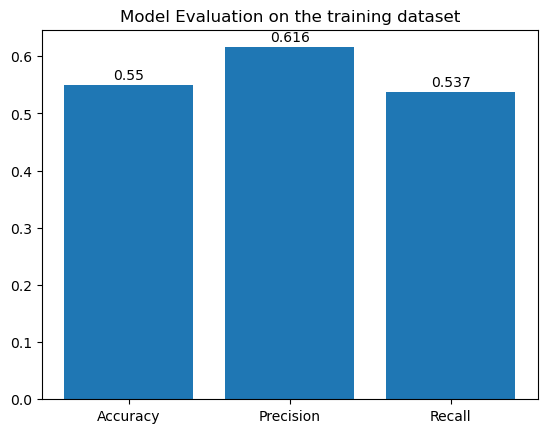

Confusion Matrix on the testing dataset:  [[110  96]
 [ 94  90]]


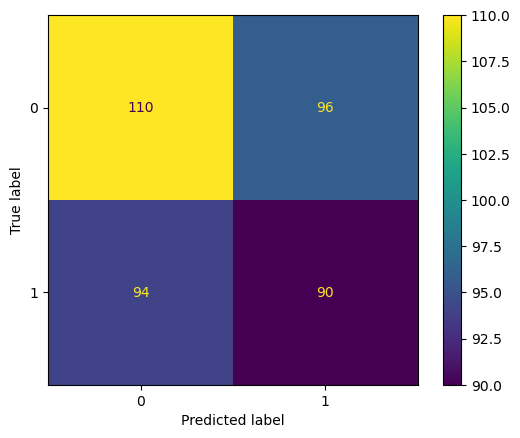

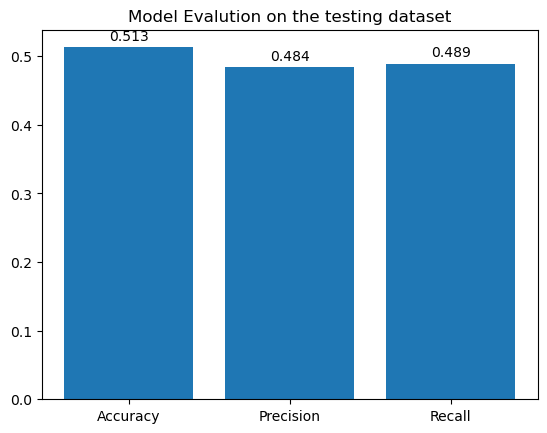

In [21]:
preds = predict(train, test, predictors, model)
best_models.append(["Naive Bayes", model, preds])

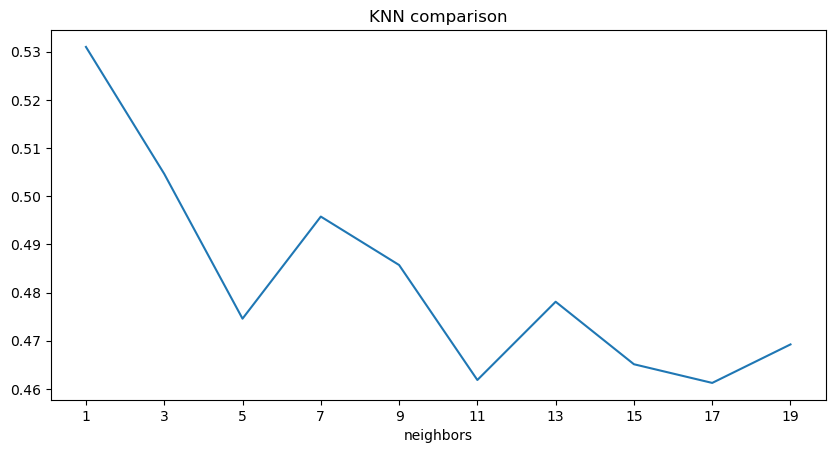

The best model achieved a precision of 0.531 with following settings: 
 kvalues: 1


In [22]:
# KNN
kvalues = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19]

model = find_best_KNN(train, test, predictors, kvalues)

Confusion Matrix on the training dataset:  [[157   0]
 [  0 203]]


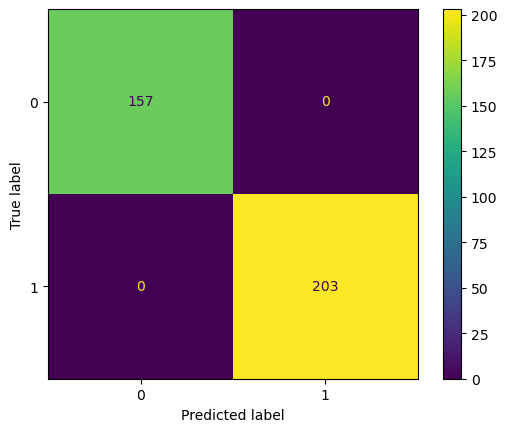

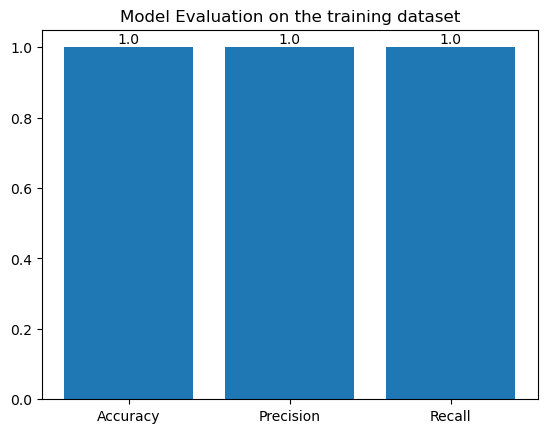

Confusion Matrix on the testing dataset:  [[100 106]
 [ 64 120]]


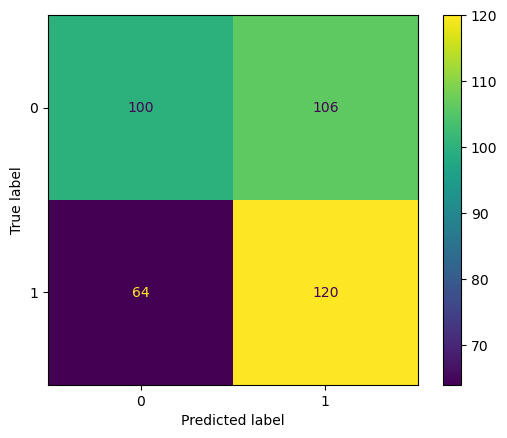

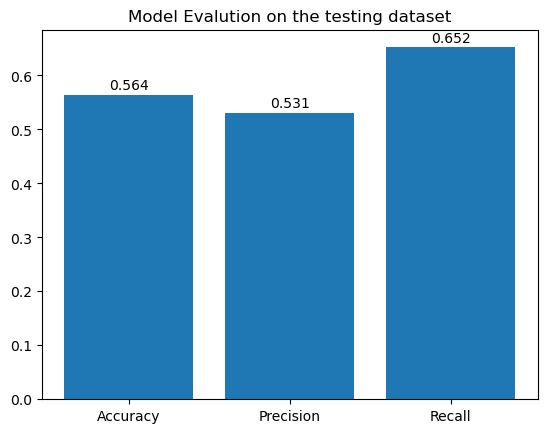

In [23]:
preds = predict(train, test, predictors, model)
best_models.append(["KNN", model, preds])

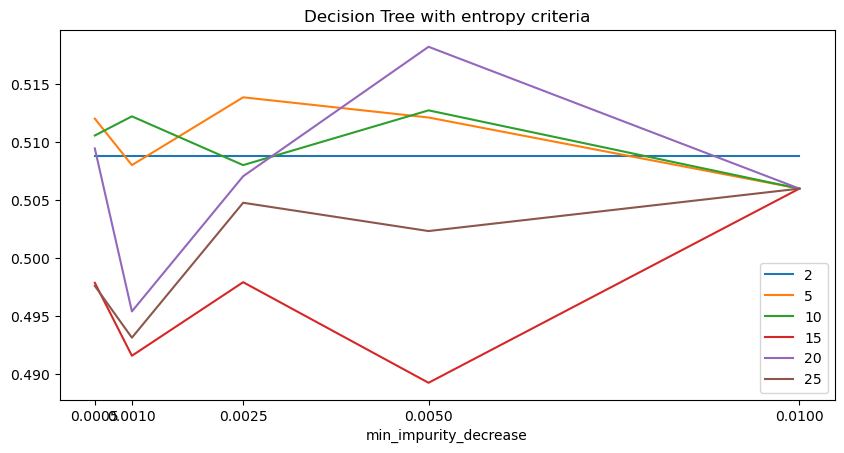

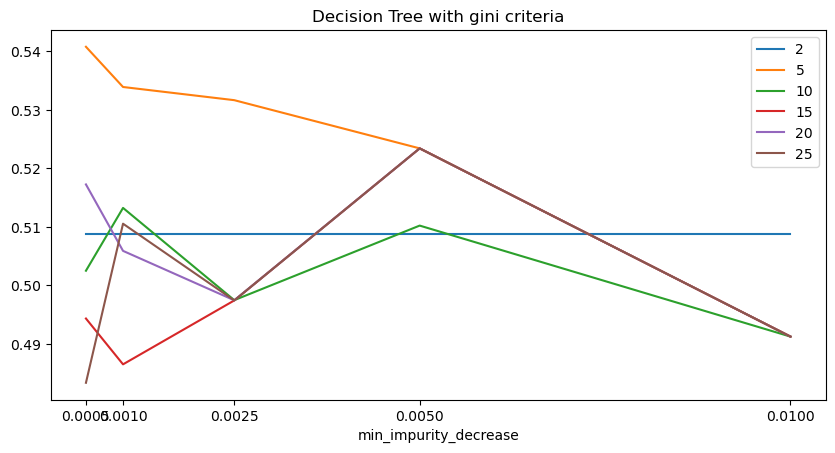

The best model achieved a precision of 0.541 with following settings: 
 criteria: gini
 max_depth: 5
 min_impurity_decrease: 0.0005


In [24]:
# Decision Tree
min_impurity_decrease = [0.01, 0.005, 0.0025, 0.001, 0.0005]
max_depths = [2, 5, 10, 15, 20, 25]
criteria = ["entropy", "gini"]

model = find_best_tree(train, test, predictors, min_impurity_decrease, max_depths, criteria)

Confusion Matrix on the training dataset:  [[ 89  68]
 [ 17 186]]


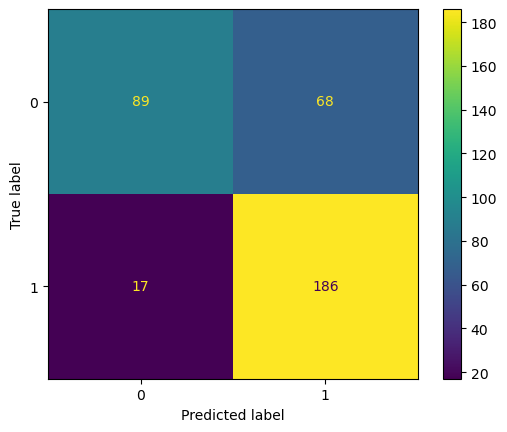

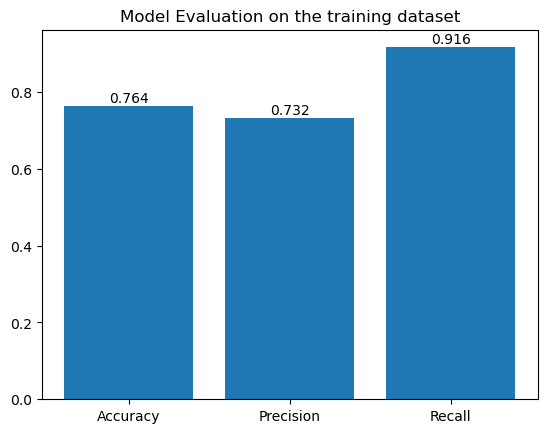

Confusion Matrix on the testing dataset:  [[ 99 107]
 [ 58 126]]


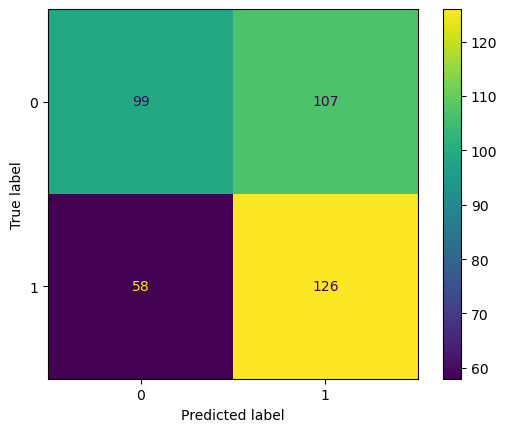

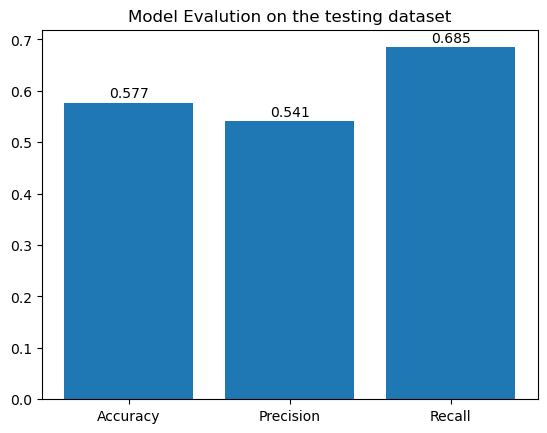

In [25]:
preds = predict(train, test, predictors, model)
best_models.append(["Decision Tree", model, preds])

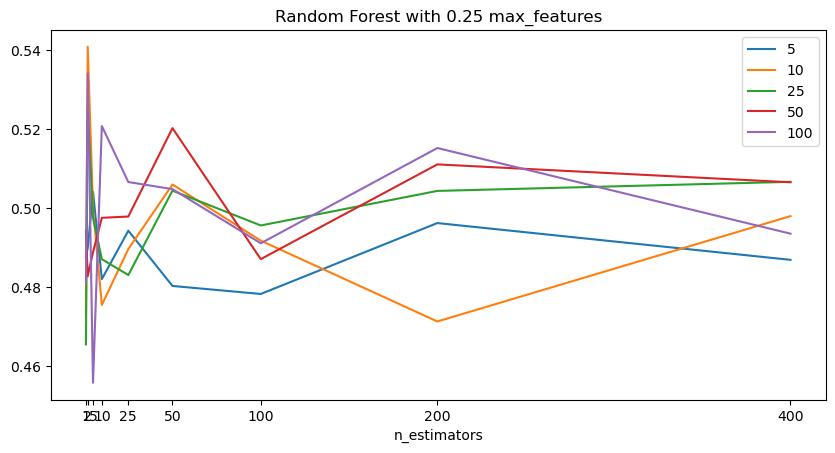

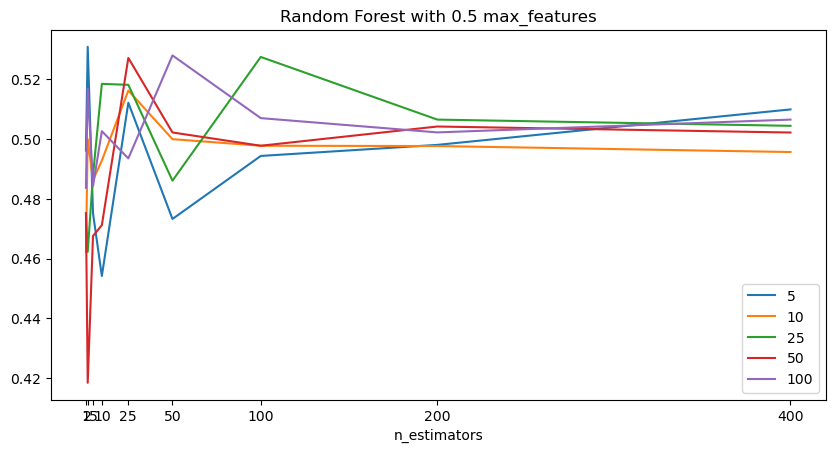

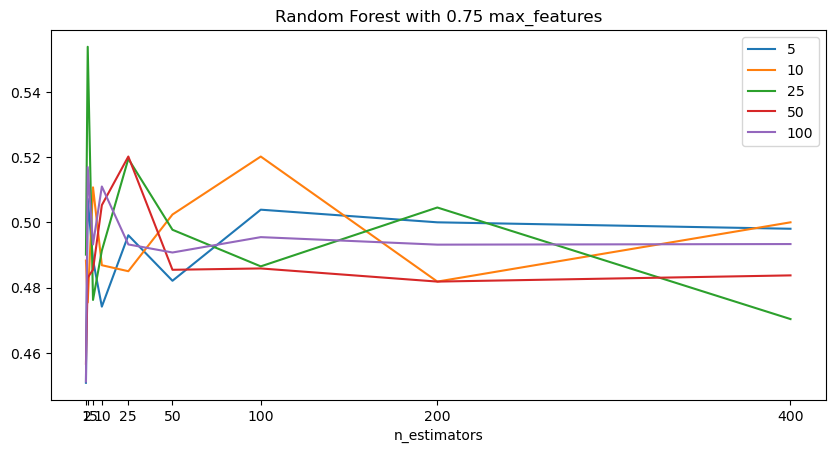

The best model achieved a precision of 0.554 with following settings: 
 max_features: 0.75
 max_depth: 25
 n_estimators: 2


In [26]:
# Random Forest
max_features = [0.25, 0.5, 0.75]
max_depths = [5, 10, 25, 50, 100]
n_estimators = [1, 2, 5, 10, 25, 50, 100, 200 , 400]

model = find_best_forest(train, test, predictors, max_features, max_depths, n_estimators)

Confusion Matrix on the training dataset:  [[148   9]
 [ 45 158]]


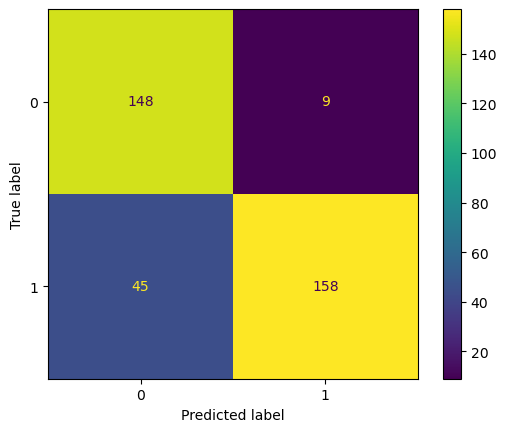

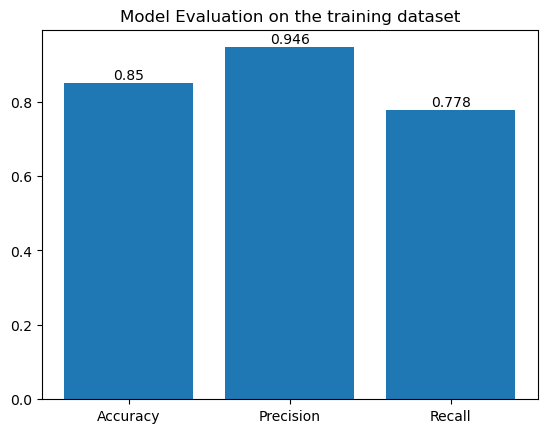

Confusion Matrix on the testing dataset:  [[148  58]
 [112  72]]


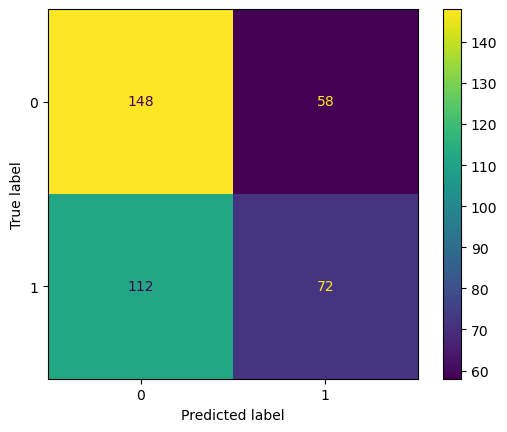

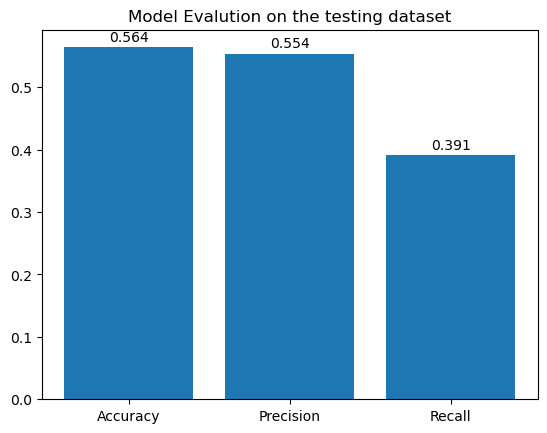

In [27]:
preds = predict(train, test, predictors, model)
best_models.append(["Random Forest", model, preds])

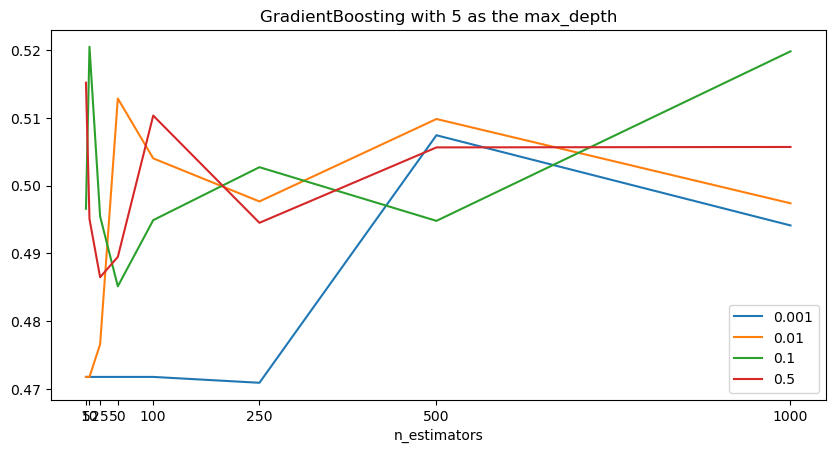

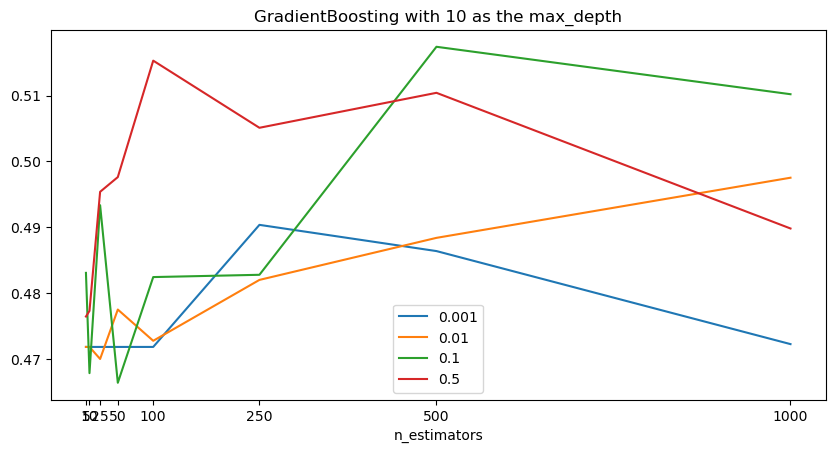

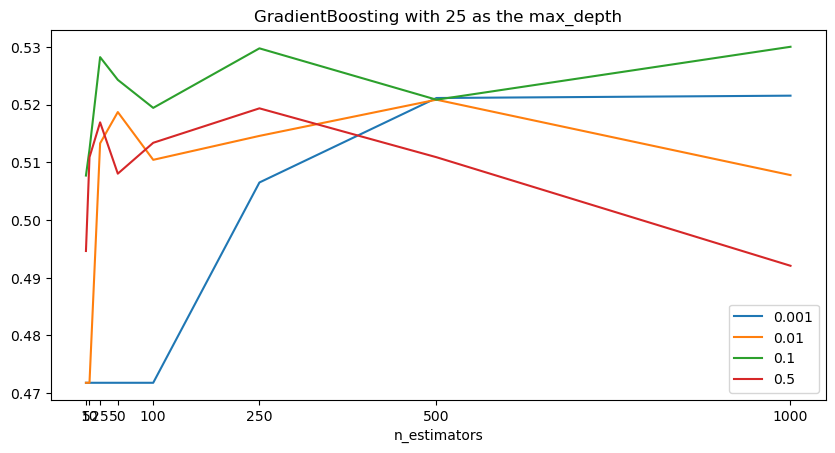

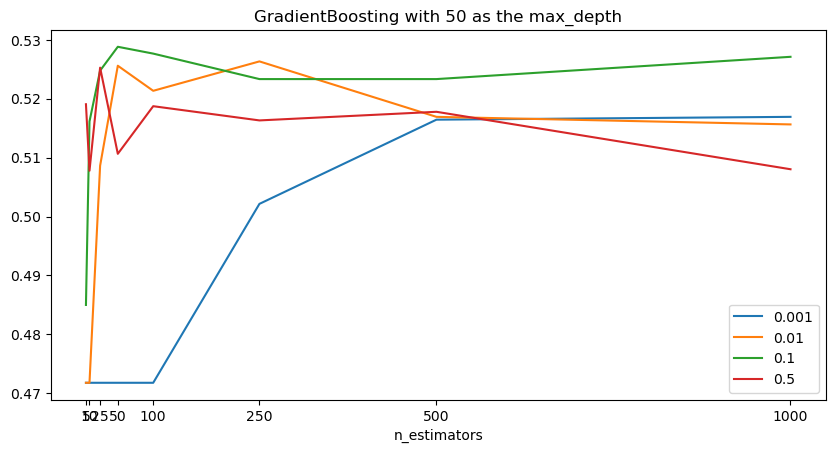

The best model achieved a precision of 0.53 with following settings: 
 max_depth: 25
 learning_rate: 0.1
 n_estimators: 1000


In [28]:
# Gradient Boosting
n_estimators = [5, 10, 25, 50, 100, 250, 500, 1000]
max_depths = [5, 10, 25, 50]
learning_rate = [0.001, 0.01, 0.1, 0.5]

model = find_best_boosting(train, test, predictors, n_estimators, max_depths, learning_rate)

Confusion Matrix on the training dataset:  [[157   0]
 [  0 203]]


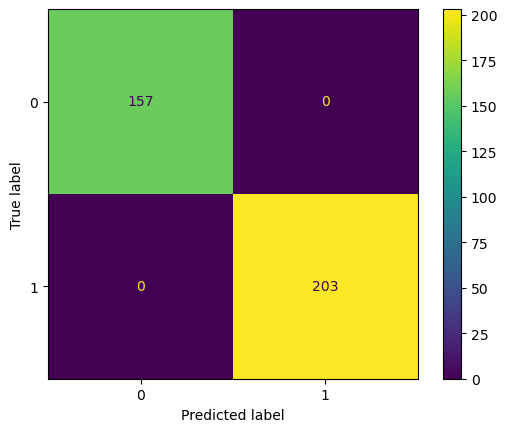

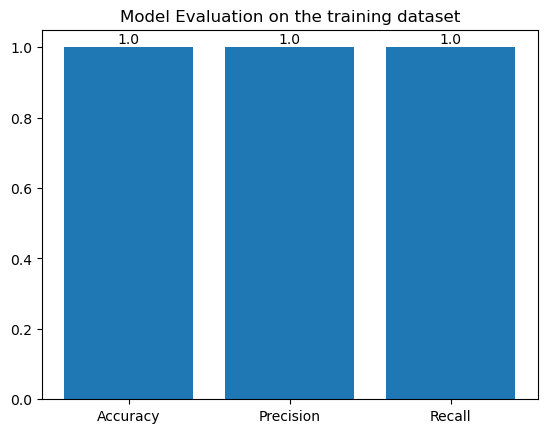

Confusion Matrix on the testing dataset:  [[112  94]
 [ 78 106]]


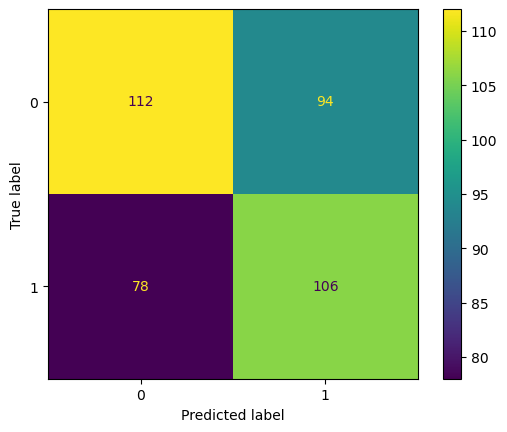

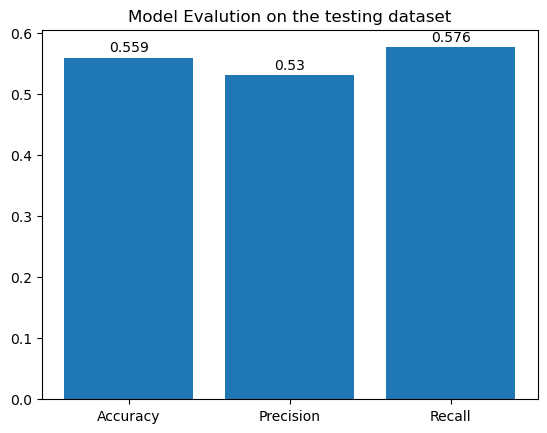

In [29]:
preds = predict(train, test, predictors, model)
best_models.append(["GradientBoosting", model, preds])

C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

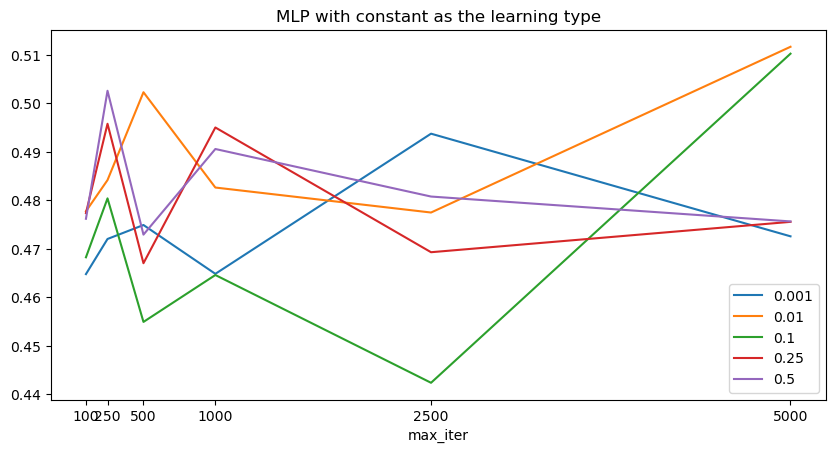

C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

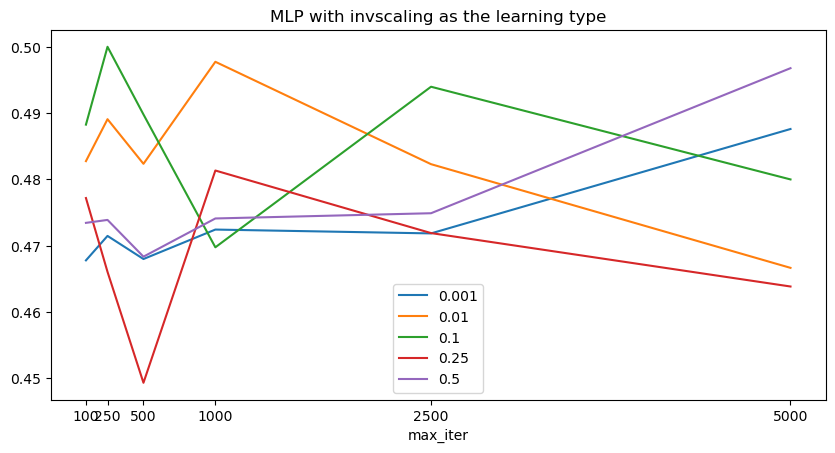

C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilaye

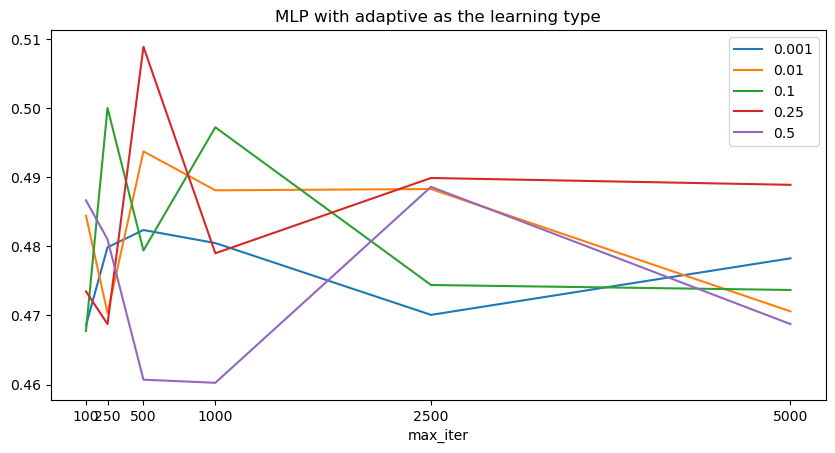

The best model achieved a precision of 0.512 with following settings: 
 learning_type: constant
 learning_rate: 0.01
 max_iter: 5000


In [30]:
# MLP
lr_type = ["constant", "invscaling", "adaptive"]
max_iter = [100, 250, 500, 1000, 2500, 5000]
learning_rate = [0.001, 0.01, 0.1, 0.25, 0.5]

model = find_best_nn(train, test, predictors, lr_type, max_iter, learning_rate)

Confusion Matrix on the training dataset:  [[104  53]
 [ 21 182]]


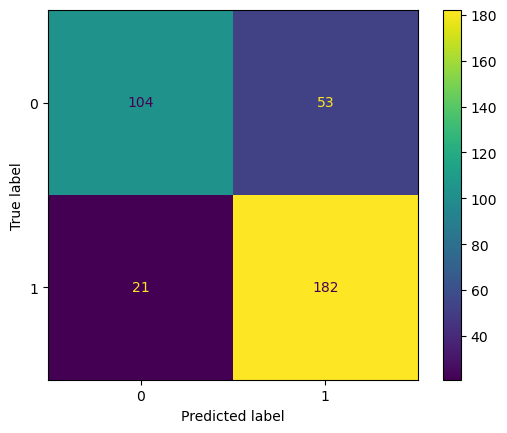

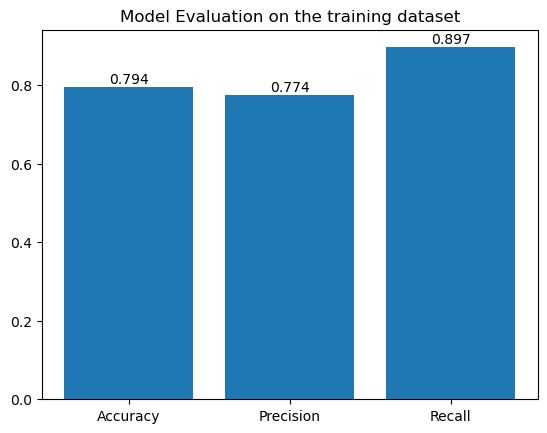

Confusion Matrix on the testing dataset:  [[ 80 126]
 [ 52 132]]


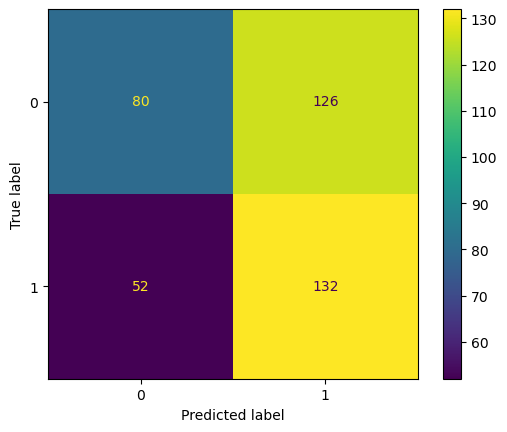

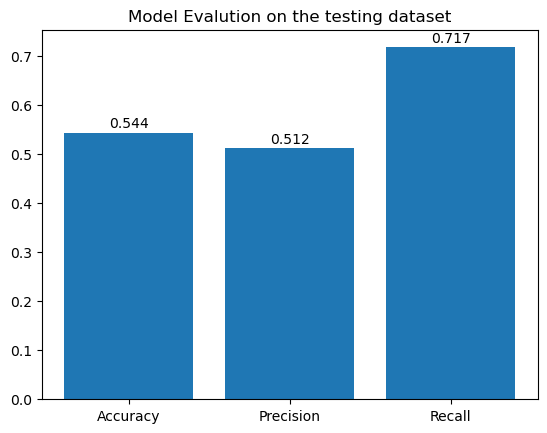

In [31]:
preds = predict(train, test, predictors, model)
best_models.append(["MLP", model, preds])

In [32]:
import numpy as np

def find_stock(preds, data, investment, week):
    # function to find a stock given the prediction of the model
    # the stock is choosen randomly out of the stocks predicted to increase in value
    # returns only stocks where the open value is lower than the investment allowed
    
    stock = -1
    preds = preds.to_numpy()

    # while no stock was picked
    while stock < 0:
        if preds.sum() == 0:
            return -1 

        random = np.random.choice(len(preds), 1, p=preds/preds.sum())
        stock_choice = data.iloc[random * 13 + week]
        
        if stock_choice["next_weeks_open"][0] <= investment:
            stock = stock_choice
            return stock
        else:
            preds[random] = 0
            
def simulate_quarter(preds, data, weekly_investment, number_of_weeks):
    # function to simulate the choices of the system
    # returns the final result in terms of profit in the end of the test set
    
    result = 0
    investment = 0
    for week in range(number_of_weeks):
        stock = find_stock(preds[week:week+30], data, weekly_investment, week)
        company = company_dict[stock.index[0][0]]
        open_price = stock["next_weeks_open"][0]
        number_of_stocks = int(weekly_investment / stock["next_weeks_open"][0])
        week_result = round((stock["next_weeks_close"][0]-stock["next_weeks_open"][0]) * number_of_stocks, 2)
        print("Company: {}. Opening Price: {}. Number of Stocks: {}. Week Result: {}$ - {}$ = {}$".format(company, 
                                                                                             open_price, 
                                                                                             number_of_stocks,
                                                                                             round(stock["next_weeks_close"][0]*number_of_stocks, 2),
                                                                                             round(open_price*number_of_stocks, 2),
                                                                                             week_result
                                                                                            )
             )
       
        result += week_result
        investment += open_price * number_of_stocks
    print("The final result was: {}$".format(round(result, 2)))
    print("Given an investment of: {}$. This represents a change of: {}%".format(round(investment, 2), round((result/investment)*100, 2)))   
    
    return round(result, 2)


In [33]:
# check the profit of the best model of every approach

best_result = ["", -999999999]

for model in best_models:
    print("Testing for: ", model[0])

    result = simulate_quarter(model[2], q2_unscaled, 100, 13)
    if result > best_result[1]:
        best_result = [model[0], result]

    print("")

print("Best Model: {}\nResult: {}$".format(*best_result))
    

Testing for:  Naive Bayes
Company: United Technologies. Opening Price: 85.66. Number of Stocks: 1. Week Result: 84.81$ - 85.66$ = -0.85$
Company: Travelers. Opening Price: 59.85. Number of Stocks: 1. Week Result: 59.8$ - 59.85$ = -0.05$
Company: AT&T. Opening Price: 30.42. Number of Stocks: 3. Week Result: 92.04$ - 91.26$ = 0.78$
Company: Wal-Mart. Opening Price: 53.6. Number of Stocks: 1. Week Result: 54.98$ - 53.6$ = 1.38$
Company: Travelers. Opening Price: 63.56. Number of Stocks: 1. Week Result: 63.43$ - 63.56$ = -0.13$
Company: AT&T. Opening Price: 31.2. Number of Stocks: 3. Week Result: 94.23$ - 93.6$ = 0.63$
Company: Travelers. Opening Price: 62.52. Number of Stocks: 1. Week Result: 62.25$ - 62.52$ = -0.27$
Company: Merck. Opening Price: 36.67. Number of Stocks: 2. Week Result: 72.42$ - 73.34$ = -0.92$
Company: Procter & Gamble. Opening Price: 66.33. Number of Stocks: 1. Week Result: 65.43$ - 66.33$ = -0.9$
Company: Travelers. Opening Price: 61.35. Number of Stocks: 1. Week Resu

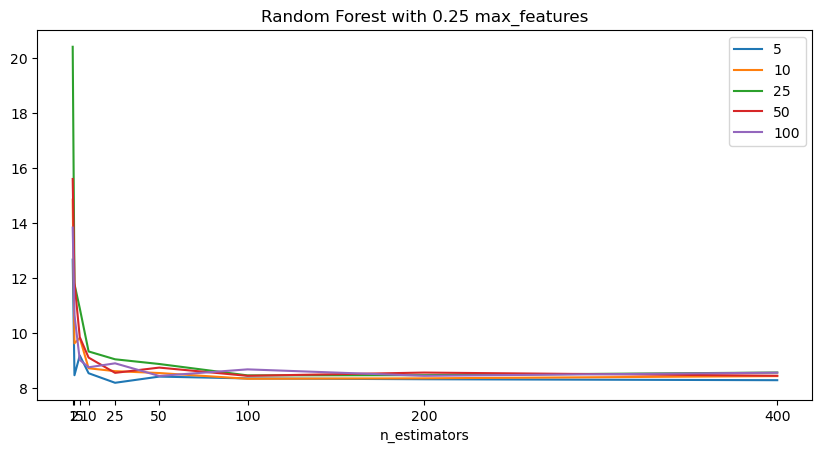

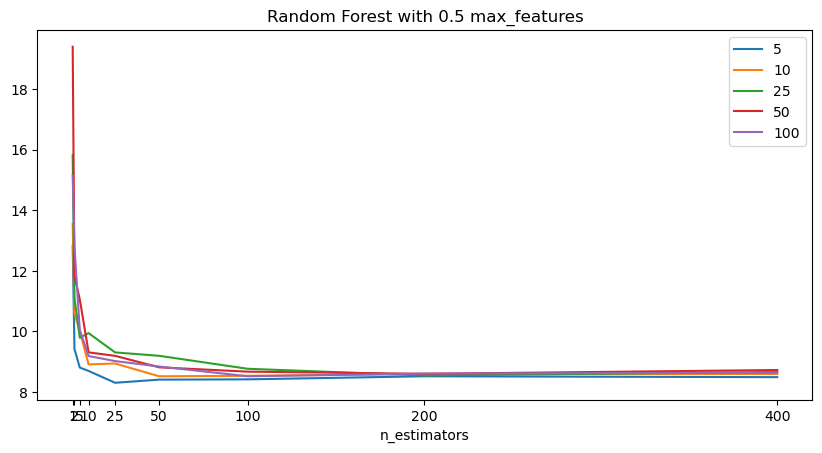

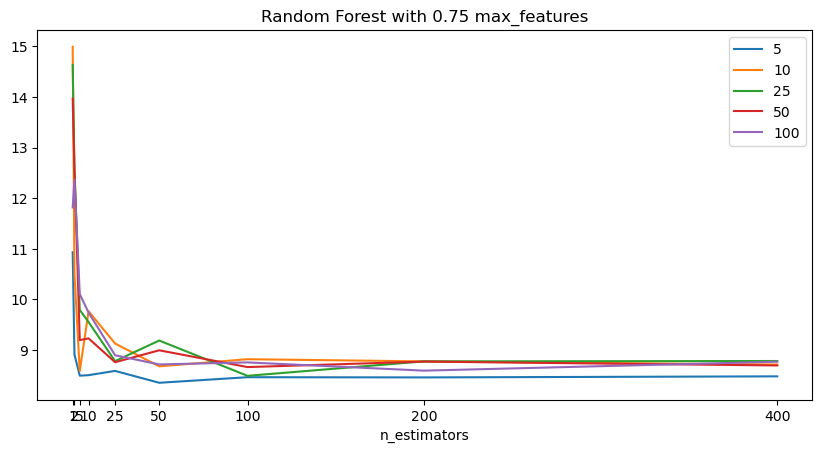

The best model achieved a MSE of 8.204 with following settings: 
 max_features: 0.25
 max_depth: 5
 n_estimators: 25


In [34]:
# Experiment with regression
# The target is to predict the percent_change_next_weeks_price value, choosing the stock that had the biggest predicted change

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

max_features = [0.25, 0.5, 0.75]
max_depths = [5, 10, 25, 50, 100]
n_estimators = [1, 2, 5, 10, 25, 50, 100, 200 , 400]

best_model = None
best_mean_squared_error = 9999
best_settings= (0,0,0)

for nf in range(len(max_features)):
    f = max_features[nf]
    values = {}
    for d in max_depths:
        yvalues = []
        for n in n_estimators:
            model = RandomForestRegressor(max_features=f, max_depth=d, n_estimators=n)
            model.fit(train[predictors], train["percent_change_next_weeks_price"])
            preds = model.predict(test[predictors])
            yvalues.append(mean_squared_error(test["percent_change_next_weeks_price"], preds))
            if yvalues[-1] < best_mean_squared_error:
                best_mean_squared_error = yvalues[-1]
                best_model = model
                best_settings = (f, d, n)
        values[d] = yvalues

    plt.figure(figsize=(10,4.8))
    plt.title("Random Forest with " + str(f) + " max_features")
    for d in range(len(max_depths)):
        plt.plot(n_estimators, values[max_depths[d]])
    plt.xlabel("n_estimators")
    plt.xticks(n_estimators)
    plt.legend(max_depths)
    plt.show()

print("The best model achieved a MSE of {} with following settings: \n max_features: {}\n max_depth: {}\n n_estimators: {}".format(round(best_mean_squared_error, 3), *best_settings) )

preds = best_model.predict(test[predictors])

In [35]:
def find_stock(preds, data, investment, week):
    # function to find a stock given the prediction of the model
    # the stock is choosen based on the stock with the biggest predicted market change 
    # returns only stocks where the open value is lower than the investment allowed
    
    stock = -1

    # while no stock was picked
    while stock < 0:
        if preds.sum() == 0:
            return -1 

        random = np.argmax(preds)
        stock_choice = data.iloc[random * 13 + week]
        if stock_choice["next_weeks_open"] <= investment:
            stock = stock_choice
            return stock
        else:
            preds[random] = 0
            
def simulate_quarter(preds, data, weekly_investment, number_of_weeks):
    # function to simulate the choices of the system
    # prints the final result in terms of profit in the end of the test set
    
    result = 0
    investment = 0
    for week in range(number_of_weeks):
        stock = find_stock(preds[week:week+30], data, weekly_investment, week)
        company = company_dict[stock.name[0]]
        open_price = stock["next_weeks_open"]
        number_of_stocks = int(weekly_investment / stock["next_weeks_open"])
        week_result = round((stock["next_weeks_close"]-stock["next_weeks_open"]) * number_of_stocks, 2)
        print("Company: {}. Opening Price: {}. Number of Stocks: {}. Week Result: {}$ - {}$ = {}$".format(company, 
                                                                                             open_price, 
                                                                                             number_of_stocks,
                                                                                             round(stock["next_weeks_close"]*number_of_stocks, 2),
                                                                                             round(open_price*number_of_stocks, 2),
                                                                                             week_result
                                                                                            )
             )
       
        result += week_result
        investment += open_price * number_of_stocks
    print("The final result was: {}$".format(round(result, 2)))
    print("Given an investment of: {}$. This represents a change of: {}%".format(round(investment, 2), round((result/investment)*100, 2)))   

simulate_quarter(preds, q2_unscaled, 100, 13)

Company: ExxonMobil. Opening Price: 84.26. Number of Stocks: 1. Week Result: 85.95$ - 84.26$ = 1.69$
Company: ExxonMobil. Opening Price: 85.95. Number of Stocks: 1. Week Result: 84.29$ - 85.95$ = -1.66$
Company: Wal-Mart. Opening Price: 53.08. Number of Stocks: 1. Week Result: 53.58$ - 53.08$ = 0.5$
Company: Verizon. Opening Price: 37.07. Number of Stocks: 2. Week Result: 75.56$ - 74.14$ = 1.42$
Company: United Technologies. Opening Price: 90.03. Number of Stocks: 1. Week Result: 89.21$ - 90.03$ = -0.82$
Company: Travelers. Opening Price: 63.23. Number of Stocks: 1. Week Result: 62.33$ - 63.23$ = -0.9$
Company: AT&T. Opening Price: 31.32. Number of Stocks: 3. Week Result: 93.96$ - 93.96$ = 0.0$
Company: Procter & Gamble. Opening Price: 66.8. Number of Stocks: 1. Week Result: 66.2$ - 66.8$ = -0.6$
Company: Pfizer. Opening Price: 21.0. Number of Stocks: 4. Week Result: 83.36$ - 84.0$ = -0.64$
Company: Microsoft. Opening Price: 23.9. Number of Stocks: 4. Week Result: 94.8$ - 95.6$ = -0.8$

-----
*Add here your modelling results and conclusions (max. 200 words)*
-----

Since we are trying to invest in stocks and we can only invest in **1 company per week**, we need to chose a stock that is likely to go up. With this, I decided to use Precision as the main metric to evaluate the system since this metric evaluates the proportion of the true positives that were actually correct. Additionally, I also analyzed the accuracy and recall of the models.

In the first place, I decided to experiment with Naive Bayes to have a baseline to compare with other techniques. I decided to also experiment with KNN, Decision Trees, Random Forests, Gradient Boosting and Multi Layer Perceptrons. I created some functions to try different parametrizations of the models, selecting the ones with the highest precision as the best models. 

Furthermore, I created a function to simulate the run of the best models through the test set (2nd quarter). The goal was to see if the choices of the models actually resulted in profits for the client.

Additionally, I tried a different approach. Instead of trying to solve the problem as a classification problem (classifying if the stock is going to be profitable in the next week), I tried to predict the change in price of the stock in the following week. To do so, I used the RandomForestRegressor and trained the model with the same variables as in the classification task and with different parametrizations, while trying to minimize the MSE (mean squared error).

## Conclusions
In the conclusions, you should enumerate the results you got after completing the challenge.
* How good do you consider your results? 
* What are some factors that would contribute to get better results?
* What are some advantages and disadvantages of your solution?
* What can be done as future work to improve your results?

-----
*Add here your final conclusions (max. 400 words)*
-----

As explained in the section above, I decided to use as the baseline the results of Naive Bayes. This model obtained a precision of 0.484.

The results of the different models can be observed in the following table:

| Models | No Scaling | Standardization | Normalization | MinMax Scaling | Standardization w/market_movement |
|---|---|---|---|---|---|
| Naive Bayes |  0.472 | 0.484  | 0.472  | 0.472  | 0.481  |
| KNN |  0.486 | 0.531  | 0.507  | 0.502  | 0.493  |
| Decision Tree | 0.507  | 0.528  | 0.487  | 0.513  | 0.534  |
| Random Forest | 0.542  | **0.578**  | 0.527  | 0.544  | 0.558  |
| GradientBoosting | 0.504  | 0.538  | 0.49  | 0.522  |  0.498 |
| MLP | 0.472  | 0.522  | 0.472  | 0.532  |  0.517 |

We can observe from the table that the scaling improved the results of some models. In particular, KNN and MLP improved as it was expected since they are dependent on the variables having a similar range (this didn't occur in the original dataset). MLP without scaling achieved a precision of 0.472 but also a recall of 1. This occurs because the model predicted that every stock was profitable.

From the table, the model with the best results was the RandomForest with the standardization scaling, achieving a precision of 0.578. 

Additionally, we observe that the market_movement variable did not improve the results of the models. This variable was created to give more information about the movement of the majority of the market.

Furthermore, I simulated these models going through the 2nd quarter while selecting one stock to invest each week. This stock was chosen randomly out of the ones classified as profitable. After performing some runs, I observed that the models presented similar results, where they all presented profits of around 0.5%. I expected better results since the precisions obtained were higher than 50%. Even the model with the best results, RandomForest, presented similar results when compared with the other models.

With this, I decided to follow a different approach. Instead of trying to classify a stock as profitable or not, I tried to predict the actual movement of the stock. To do so, I experimented with two models: RandomForestRegressor and MLPRegressor. They presented similar results in terms of MSE (mean squared error). After simulating the use of the models through the 2nd quarter, while selecting the stock that was expected to be the most profitable, the results were similar to the ones coming from the classification approach.

In order to obtain better results, I think the main limitation was the dataset. Training with only 1 quarter does not allow to obtain information about seasonal or cyclic changes that can occur in a stock market. Additionally, after plotting the stock graphs of each company in the 2nd quarter, I observed that the majority of the stocks were on a downward trend, which hinders the task of obtaining profit. 

Moreover, more data is also fairly important to train complex models such as RandomForests and MLP classifiers. After only using data from the 1st quarter, I observed that the RandomForestClassifier presented the best results with a low number of estimators (2 and 5 trees).

In terms of the advantages of my solution, in my opinion, achieving a small profit while investing in only 1 company per week with such little information about the previous behavior of the stock market was positive. On the opposite note, I cannot affirm with certainty that the system would have the same reaction for example in the 3rd quarter of the year since the data to train the models was fairly small.

As future work, if more data was available, a different approach such as time series could be used to try to predict the stock prices using information about the trend and seasonal changes of stocks. Additionally, if the client relaxed the limitation of only picking 1 stock per week, we could diversify the portfolio and buy more stocks considered to be profitable in order to obtain better results. Furthermore, it could be interesting to analyze the data at a finer range, i.e., instead of having the stocks on a weekly basis, having the stocks on a daily basis. Finally, instead of trying to capture the market movement as a whole, it could be interesting to try to predict the marker movement as multiple groups, i.e., clothing brands, IT companies, food chains, etc. This can be a better way of predicting the market movement of certain companies.